# Medical Brief Hospital Course 전처리 파이프라인
## taskA_train.csv 데이터 전처리 완전 가이드

이 노트북은 의료 기록 요약 대회를 위한 데이터 전처리 파이프라인입니다.

## 1. 라이브러리 임포트 및 설정

In [1]:
import pandas as pd
import numpy as np
import re
import json
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

from collections import Counter, defaultdict

# 텍스트 처리
import string
from collections import Counter

# 시각화
import matplotlib.pyplot as plt
import seaborn as sns

# 한글 폰트 설정 (필요시)
# 한글 설정
import matplotlib as mpl
mpl.rc("font", family="AppleGothic") # Mac

print("✅ 라이브러리 로드 완료")

✅ 라이브러리 로드 완료


## 2. 데이터 로드 및 기본 탐색

In [2]:
# 데이터 로드
df_train = pd.read_csv('/Users/solkim/Dev/datathon/data/taskA_train.csv')

print("📊 데이터 기본 정보")
print(f"- 전체 레코드 수: {len(df_train):,}개")
print(f"- 전체 컬럼 수: {len(df_train.columns)}개")
print("\n컬럼 목록:")
for i, col in enumerate(df_train.columns, 1):
    print(f"{i:2}. {col}")

📊 데이터 기본 정보
- 전체 레코드 수: 1,000개
- 전체 컬럼 수: 29개

컬럼 목록:
 1. sample_id
 2. gender
 3. anchor_age
 4. anchor_year
 5. anchor_year_group
 6. dod
 7. admittime
 8. dischtime
 9. deathtime
10. admission_type
11. admission_location
12. discharge_location
13. hospital_expire_flag
14. medical record
15. chiefcomplaint
16. acuity
17. o2sat
18. heartrate
19. resprate
20. dbp
21. sbp
22. temperature
23. pain
24. transfer_id
25. eventtype
26. careunit
27. intime
28. outtime
29. target


In [3]:
# 수치형 컬럼의 기본 통계치를 확인합니다.
numeric_cols = df_train.select_dtypes(include=[np.number]).columns
display(df_train[numeric_cols].describe().T)

,count,mean,std,min,25%,50%,75%,max
sample_id,1000.0,4.995000e+02,2.888194e+02,0.0,249.75,499.5,749.25,999.0
anchor_age,1000.0,6.288100e+01,1.746814e+01,19.0,52.00,64.5,76.00,91.0
anchor_year,1000.0,2.151149e+03,2.339042e+01,2110.0,2132.00,2151.0,2171.00,2208.0
hospital_expire_flag,1000.0,1.000000e-03,3.162278e-02,0.0,0.00,0.0,0.00,1.0
acuity,985.0,2.134010e+00,6.000598e-01,1.0,2.00,2.0,3.00,4.0
o2sat,883.0,9.764779e+01,2.260642e+00,73.0,96.00,98.0,100.00,100.0
heartrate,892.0,8.346973e+01,2.008736e+01,35.0,70.00,82.0,94.25,180.0
resprate,886.0,1.787246e+01,2.533078e+00,10.0,16.00,18.0,18.00,40.0
dbp,890.0,7.685506e+01,1.547633e+01,30.0,67.00,77.5,87.00,154.0
sbp,893.0,1.369373e+02,2.491817e+01,11.0,121.00,136.0,151.00,226.0


In [4]:
df_train['anchor_year_group'].value_counts()

anchor_year_group
2017 - 2019    506
2014 - 2016    307
2008 - 2010    124
2011 - 2013     63
Name: count, dtype: int64

In [5]:
display(df_train['target'].tail(1))

999    PATIENT SUMMARY:\n================\nMr. ___ is...
Name: target, dtype: object

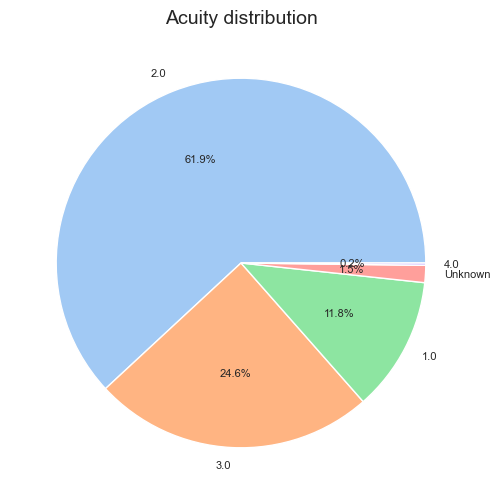

In [6]:
sns.set_theme(style="whitegrid", palette="pastel")

# 1) acuity 파이 차트
acuity_counts = (
    df_train['acuity']
    .fillna('Unknown')
    .value_counts()
    .sort_values(ascending=False)
)

fig, ax = plt.subplots(figsize=(6, 6))
ax.pie(
    acuity_counts.values,
    labels=acuity_counts.index,
    autopct='%1.1f%%',
    wedgeprops={'edgecolor': 'white'},
    textprops={'fontsize': 8}
)
ax.set_title('Acuity distribution', fontsize=14)
plt.show()

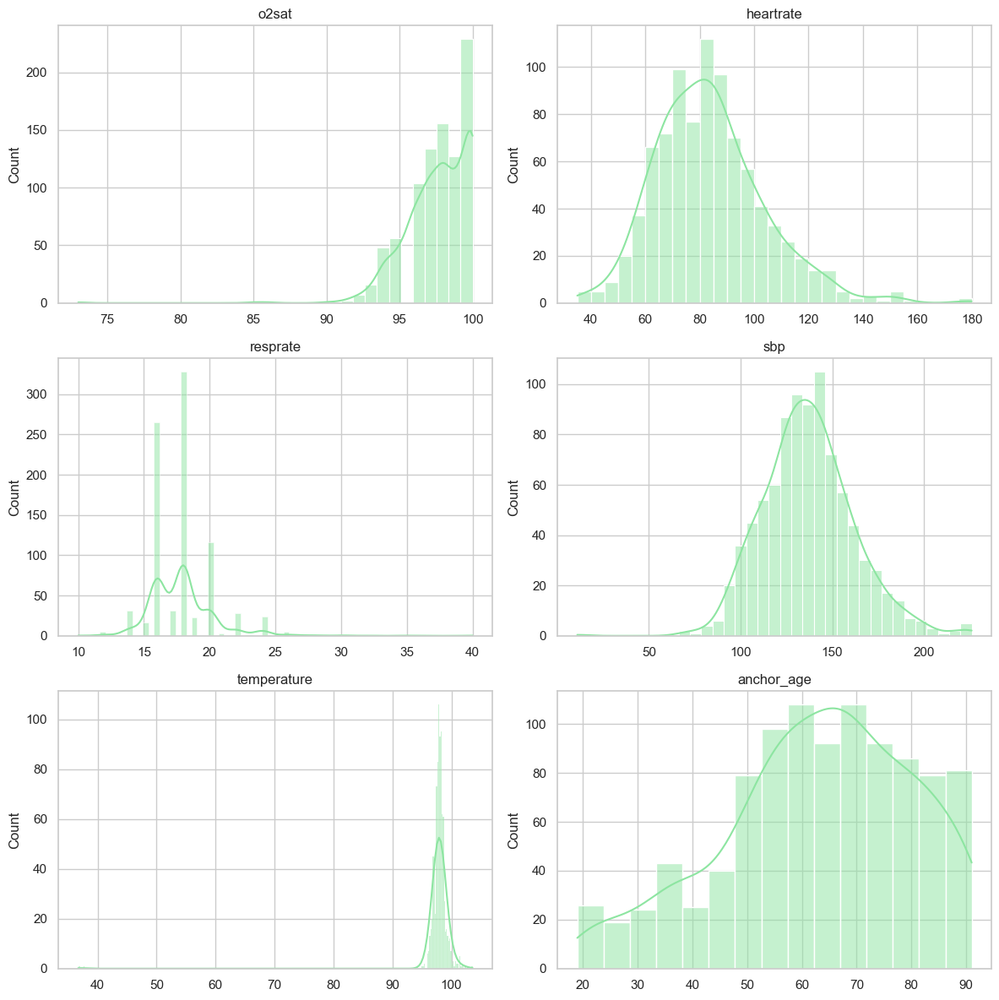

In [7]:
# 2) 연속형 변수 분포 (히스토그램 + 커널밀도)
continuous_cols = ['o2sat', 'heartrate', 'resprate', 'sbp', 'temperature', 'anchor_age']

fig, axes = plt.subplots(ncols=2, nrows=3, figsize=(12, 12))
axes = axes.flatten()

for ax, col in zip(axes, continuous_cols):
    sns.histplot(
        df_train[col],
        kde=True,
        ax=ax,
        color=sns.color_palette('pastel')[2],
        edgecolor='white'
    )
    ax.set_title(col)
    ax.set_xlabel(None)
    ax.set_ylabel('Count')

plt.tight_layout()
plt.show()

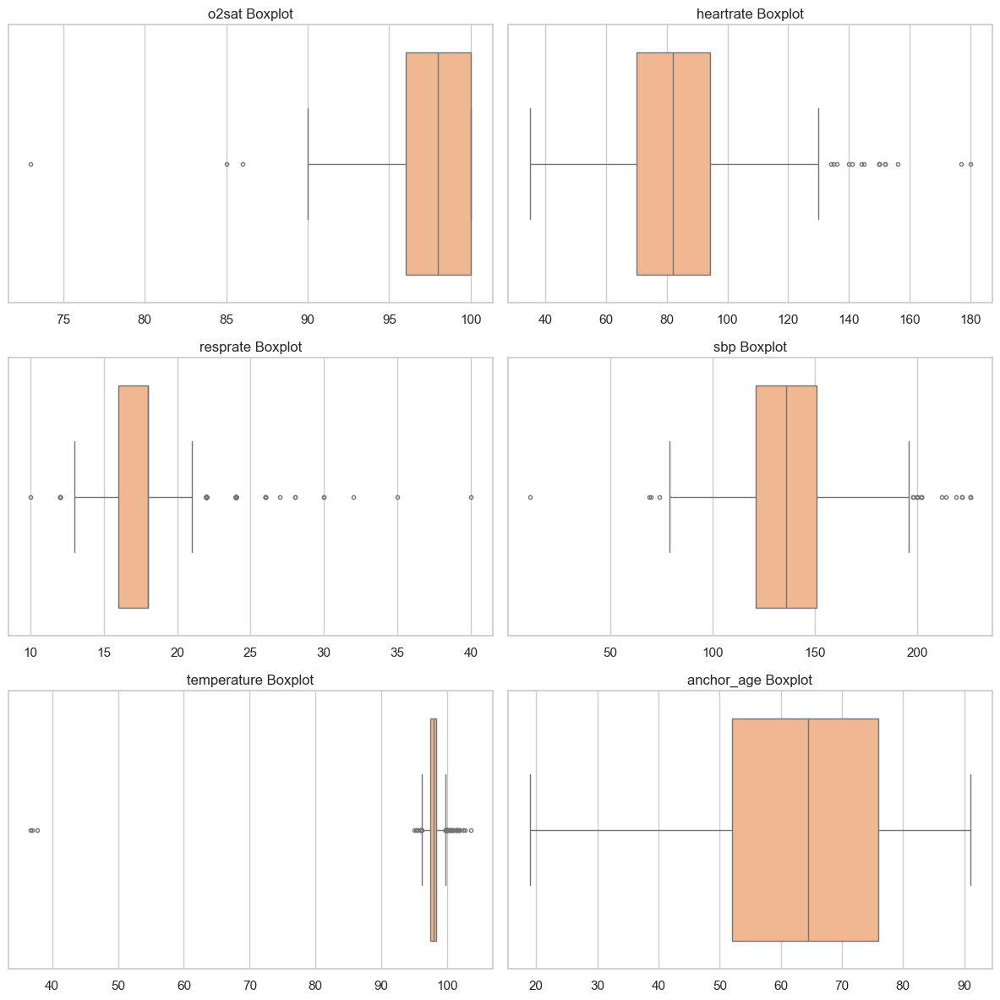

In [8]:
# 연속형 변수 박스플롯
fig, axes = plt.subplots(ncols=2, nrows=3, figsize=(12, 12))
axes = axes.flatten()

for ax, col in zip(axes, continuous_cols):
    sns.boxplot(
        x=df_train[col],
        ax=ax,
        color=sns.color_palette('pastel')[1],
        fliersize=3
    )
    ax.set_title(f'{col} Boxplot')
    ax.set_xlabel(None)

plt.tight_layout()
plt.show()

## 3. 결측치 분석 및 처리

In [9]:
# 전체 컬럼 타입과 결측치 상황을 점검합니다.
df_train.info()
print('\n결측치 개요:')
display(df_train.isna().sum().to_frame('missing_count'))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   sample_id             1000 non-null   int64  
 1   gender                1000 non-null   object 
 2   anchor_age            1000 non-null   int64  
 3   anchor_year           1000 non-null   int64  
 4   anchor_year_group     1000 non-null   object 
 5   dod                   210 non-null    object 
 6   admittime             1000 non-null   object 
 7   dischtime             1000 non-null   object 
 8   deathtime             1 non-null      object 
 9   admission_type        1000 non-null   object 
 10  admission_location    1000 non-null   object 
 11  discharge_location    902 non-null    object 
 12  hospital_expire_flag  1000 non-null   int64  
 13  medical record        1000 non-null   object 
 14  chiefcomplaint        1000 non-null   object 
 15  acuity                

,missing_count
sample_id,0
gender,0
anchor_age,0
anchor_year,0
anchor_year_group,0
dod,790
admittime,0
dischtime,0
deathtime,999
admission_type,0


🔍 결측치 분석 결과
                                column  missing_count  missing_percent
deathtime                    deathtime            999             99.9
dod                                dod            790             79.0
outtime                        outtime            234             23.4
temperature                temperature            125             12.5
o2sat                            o2sat            117             11.7
resprate                      resprate            114             11.4
dbp                                dbp            110             11.0
heartrate                    heartrate            108             10.8
sbp                                sbp            107             10.7
discharge_location  discharge_location             98              9.8
pain                              pain             20              2.0
acuity                          acuity             15              1.5


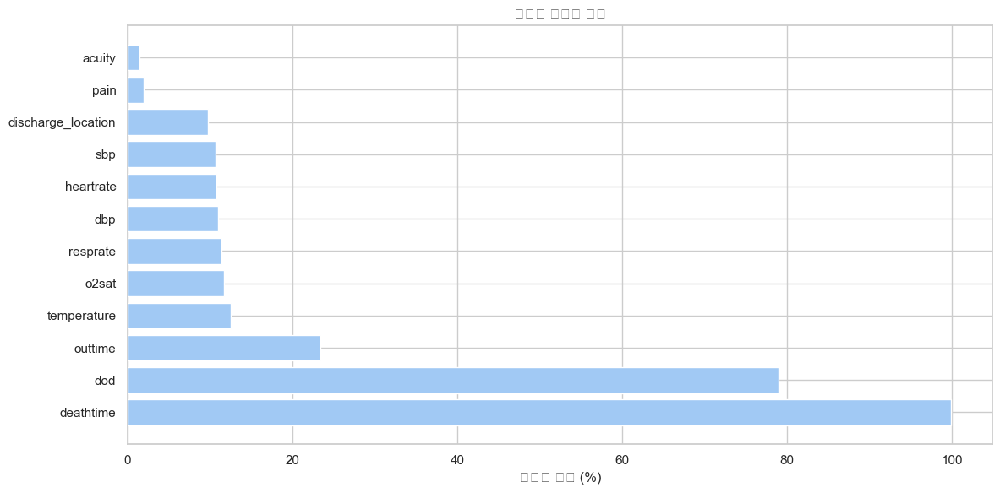

In [10]:
# 결측치 분석
def analyze_missing_values(df):
    """결측치 상세 분석"""
    missing_df = pd.DataFrame({
        'column': df.columns,
        'missing_count': df.isnull().sum(),
        'missing_percent': (df.isnull().sum() / len(df) * 100).round(2)
    })
    missing_df = missing_df[missing_df['missing_count'] > 0].sort_values('missing_percent', ascending=False)
    
    return missing_df

missing_analysis = analyze_missing_values(df_train)
print("🔍 결측치 분석 결과")
print(missing_analysis.to_string())

# 시각화
if len(missing_analysis) > 0:
    plt.figure(figsize=(12, 6))
    plt.barh(missing_analysis['column'], missing_analysis['missing_percent'])
    plt.xlabel('결측치 비율 (%)')
    plt.title('컬럼별 결측치 비율')
    plt.tight_layout()
    plt.show()

In [11]:
# 결측치 처리 전략
def handle_missing_values(df):
    """결측치 처리"""
    df = df.copy()
    
    # 1. 사망 관련 필드 (대부분 결측 = 생존)
    df['deathtime'] = df['deathtime'].fillna('Not Applicable')
    df['hospital_expire_flag'] = df['hospital_expire_flag'].fillna(0).astype(int)
    df['dod'] = df['dod'].fillna('Not Applicable')
    
    # 2. Vital signs (결측 = 측정 안함)
    vital_columns = ['temperature', 'o2sat', 'heartrate', 'resprate', 'dbp', 'sbp']
    for col in vital_columns:
        df[col] = df[col].fillna(-999)  # 특수값으로 표시
        # ==============-999로 하는게 타당할지?===============
    
    # 3. Pain score (결측 = 평가 안함)
    df['pain'] = df['pain'].fillna('Not Assessed')
    
    # 4. 위치/시간 정보
    df['discharge_location'] = df['discharge_location'].fillna('Unknown')
    df['outtime'] = df['outtime'].fillna(df['dischtime'])  # 퇴원시간으로 대체
    
    # 5. Acuity (중증도)
    df['acuity'] = df['acuity'].fillna(df['acuity'].median())
    
    return df

df_train_cleaned = handle_missing_values(df_train)
print("✅ 결측치 처리 완료")
print(f"처리 후 결측치: {df_train_cleaned.isnull().sum().sum()}개")

✅ 결측치 처리 완료
처리 후 결측치: 0개


In [12]:
df_train['hospital_expire_flag'].value_counts()

hospital_expire_flag
0    999
1      1
Name: count, dtype: int64

In [13]:
df_test = pd.read_csv('/Users/solkim/Dev/datathon/data/taskA_test.csv')
df_test['hospital_expire_flag'].value_counts()

hospital_expire_flag
0    100
Name: count, dtype: int64

## 사망 환자 
- 훈련 1000명중 1명
- 테스트 100명중 없음

## 4-1. Medical Record 기본 통계 분석

In [14]:
# 1. 텍스트 길이 분석
df_train['record_length'] = df_train['medical record'].str.len()
df_train['record_words'] = df_train['medical record'].str.split().str.len()
df_train['record_lines'] = df_train['medical record'].str.count('\n') + 1
df_train['record_sentences'] = df_train['medical record'].str.count('[.!?]') + 1

print("📏 Medical Record 길이 통계")
print("="*50)
print(f"문자 수:")
print(f"  평균: {df_train['record_length'].mean():,.0f}자")
print(f"  중앙값: {df_train['record_length'].median():,.0f}자")
print(f"  최소: {df_train['record_length'].min():,.0f}자")
print(f"  최대: {df_train['record_length'].max():,.0f}자")
print(f"\n단어 수:")
print(f"  평균: {df_train['record_words'].mean():,.0f}개")
print(f"  중앙값: {df_train['record_words'].median():,.0f}개")
print(f"\n줄 수:")
print(f"  평균: {df_train['record_lines'].mean():,.0f}줄")
print(f"\n문장 수:")
print(f"  평균: {df_train['record_sentences'].mean():,.0f}개")

📏 Medical Record 길이 통계
문자 수:
  평균: 6,192자
  중앙값: 5,712자
  최소: 984자
  최대: 32,945자

단어 수:
  평균: 890개
  중앙값: 824개

줄 수:
  평균: 187줄

문장 수:
  평균: 96개


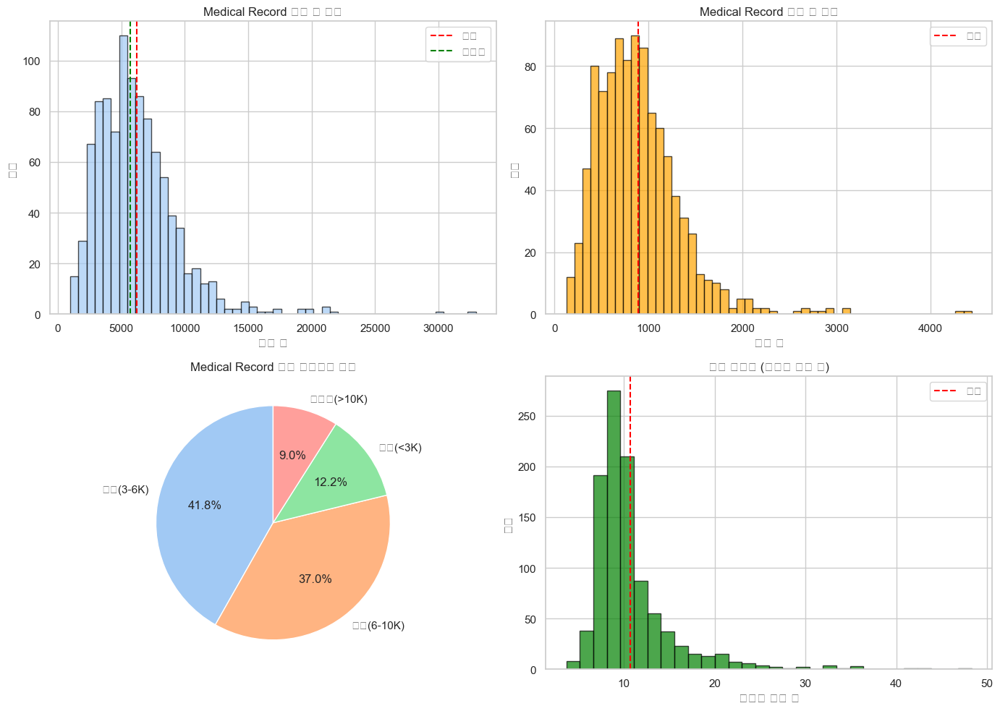

In [15]:
# 2. 길이 분포 시각화
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# 문자 수 분포
axes[0, 0].hist(df_train['record_length'], bins=50, edgecolor='black', alpha=0.7)
axes[0, 0].axvline(df_train['record_length'].mean(), color='red', linestyle='--', label='평균')
axes[0, 0].axvline(df_train['record_length'].median(), color='green', linestyle='--', label='중앙값')
axes[0, 0].set_xlabel('문자 수')
axes[0, 0].set_ylabel('빈도')
axes[0, 0].set_title('Medical Record 문자 수 분포')
axes[0, 0].legend()

# 단어 수 분포
axes[0, 1].hist(df_train['record_words'], bins=50, edgecolor='black', alpha=0.7, color='orange')
axes[0, 1].axvline(df_train['record_words'].mean(), color='red', linestyle='--', label='평균')
axes[0, 1].set_xlabel('단어 수')
axes[0, 1].set_ylabel('빈도')
axes[0, 1].set_title('Medical Record 단어 수 분포')
axes[0, 1].legend()

# 길이 카테고리
length_categories = pd.cut(df_train['record_length'], 
                          bins=[0, 3000, 6000, 10000, 50000],
                          labels=['짧음(<3K)', '보통(3-6K)', '긴편(6-10K)', '매우김(>10K)'])
length_dist = length_categories.value_counts()

axes[1, 0].pie(length_dist.values, labels=length_dist.index, autopct='%1.1f%%', startangle=90)
axes[1, 0].set_title('Medical Record 길이 카테고리 분포')

# 문장당 단어 수
df_train['words_per_sentence'] = df_train['record_words'] / df_train['record_sentences']
axes[1, 1].hist(df_train['words_per_sentence'].dropna(), bins=30, edgecolor='black', alpha=0.7, color='green')
axes[1, 1].axvline(df_train['words_per_sentence'].mean(), color='red', linestyle='--', label='평균')
axes[1, 1].set_xlabel('문장당 단어 수')
axes[1, 1].set_ylabel('빈도')
axes[1, 1].set_title('문장 복잡도 (문장당 단어 수)')
axes[1, 1].legend()

plt.tight_layout()
plt.show()

## 4-2. Medical Record 섹션 구조 분석

In [16]:
# 3. 섹션 패턴 추출
def analyze_sections(df_sample):
    """Medical Record의 섹션 구조 분석"""
    
    section_patterns = {
        # 기본 정보 섹션
        'Name/Unit': r'Name:.*Unit No',
        'Admission/Discharge Date': r'Admission Date:.*Discharge Date',
        'Date of Birth/Sex': r'Date of Birth:.*Sex:',
        'Service': r'Service:',
        'Allergies': r'Allergies:',
        'Attending': r'Attending:',
        
        # 임상 섹션
        'Chief Complaint': r'Chief Complaint:',
        'Major Surgical/Invasive': r'Major Surgical or Invasive Procedure:',
        'History of Present Illness': r'History of Present Illness:',
        'Past Medical History': r'Past Medical History:',
        'Social History': r'Social History:',
        'Family History': r'Family History:',
        'Physical Exam': r'Physical Exam:',
        'Pertinent Results': r'Pertinent Results:',
        'Brief Hospital Course': r'Brief Hospital Course:',
        'Medications on Admission': r'Medications on Admission:',
        'Discharge Medications': r'Discharge Medications:',
        'Discharge Disposition': r'Discharge Disposition:',
        'Discharge Diagnosis': r'Discharge Diagnosis:',
        'Discharge Condition': r'Discharge Condition:',
        'Discharge Instructions': r'Discharge Instructions:',
        'Followup Instructions': r'Followup Instructions:'
    }
    
    section_counts = defaultdict(int)
    
    for idx, record in enumerate(df_sample['medical record'].head(500)):
        if pd.notna(record):
            for section_name, pattern in section_patterns.items():
                if re.search(pattern, record, re.IGNORECASE):
                    section_counts[section_name] += 1
    
    return section_counts

section_counts = analyze_sections(df_train)

# 섹션 빈도 정렬
section_freq = pd.DataFrame(list(section_counts.items()), columns=['Section', 'Count'])
section_freq['Percentage'] = (section_freq['Count'] / min(500, len(df_train)) * 100).round(1)
section_freq = section_freq.sort_values('Count', ascending=False)

print("📂 Medical Record 섹션 구조 분석 (500개 샘플)")
print("="*60)
for _, row in section_freq.iterrows():
    print(f"{row['Section']:30} : {row['Count']:3}개 ({row['Percentage']:5.1f}%)")

📂 Medical Record 섹션 구조 분석 (500개 샘플)
Admission/Discharge Date       : 500개 (100.0%)
Date of Birth/Sex              : 500개 (100.0%)
Service                        : 500개 (100.0%)
Allergies                      : 500개 (100.0%)
Attending                      : 500개 (100.0%)
Pertinent Results              : 500개 (100.0%)
Major Surgical/Invasive        : 499개 ( 99.8%)
Past Medical History           : 486개 ( 97.2%)
Name/Unit                      : 485개 ( 97.0%)
Social History                 : 483개 ( 96.6%)
Chief Complaint                : 482개 ( 96.4%)
History of Present Illness     : 482개 ( 96.4%)
Family History                 : 479개 ( 95.8%)
Physical Exam                  : 477개 ( 95.4%)


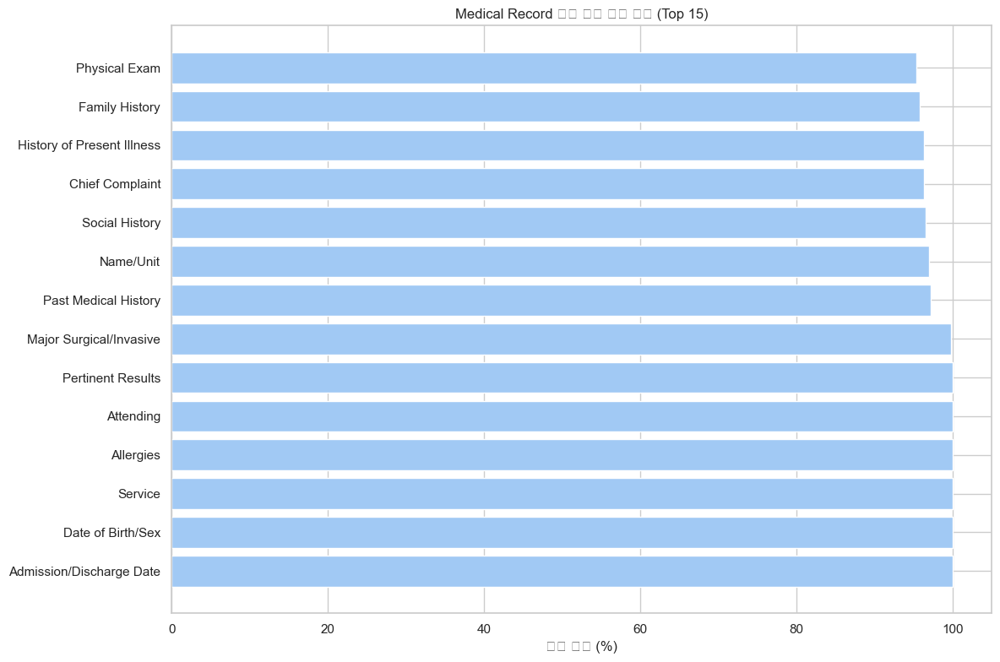

In [17]:
# 4. 섹션 존재 여부 시각화
plt.figure(figsize=(12, 8))
plt.barh(section_freq['Section'][:15], section_freq['Percentage'][:15])
plt.xlabel('존재 비율 (%)')
plt.title('Medical Record 주요 섹션 존재 비율 (Top 15)')
plt.tight_layout()
plt.show()


## 4-3. Medical Record 시작 패턴 분석

In [18]:
# 5. 시작 패턴 분석
def analyze_start_patterns(records, n_chars=200):
    """Medical Record 시작 부분 패턴 분석"""
    
    start_patterns = []
    for record in records:
        if pd.notna(record):
            # 첫 200자 추출
            start = record[:n_chars]
            # 개인정보 마스킹 일반화
            start = re.sub(r'_{2,}', 'XXX', start)
            start = re.sub(r'\[\*\*[^\]]*\*\*\]', 'XXX', start)
            start = re.sub(r'\d{4}-\d{2}-\d{2}', 'DATE', start)
            start = re.sub(r'\d+', 'NUM', start)
            start_patterns.append(start)
    
    return start_patterns

start_patterns = analyze_start_patterns(df_train['medical record'])

# 가장 흔한 시작 패턴 찾기
print("🚀 Medical Record 시작 패턴 분석")
print("="*60)

# 패턴 카테고리화
pattern_types = {
    'Standard Header': 0,  # Name: ___ Unit No: 형태
    'Direct Clinical': 0,  # 바로 임상 정보 시작
    'Admission Info': 0,   # Admission Date로 시작
    'Other': 0
}

for pattern in start_patterns:
    if 'Name:' in pattern and 'Unit No' in pattern:
        pattern_types['Standard Header'] += 1
    elif 'Admission Date' in pattern[:50]:
        pattern_types['Admission Info'] += 1
    elif any(word in pattern[:100].lower() for word in ['chief', 'history', 'patient']):
        pattern_types['Direct Clinical'] += 1
    else:
        pattern_types['Other'] += 1

for ptype, count in pattern_types.items():
    print(f"{ptype:20} : {count:3}개 ({count/len(start_patterns)*100:.1f}%)")

print("\n[표준 헤더 예시]")
print(start_patterns[0][:150])

🚀 Medical Record 시작 패턴 분석
Standard Header      : 977개 (97.7%)
Direct Clinical      :   0개 (0.0%)
Admission Info       :   5개 (0.5%)
Other                :  18개 (1.8%)

[표준 헤더 예시]
Name:  XXX                      Unit No:   XXX
 
Admission Date:  XXX              Discharge Date:   XXX
 
Date of Birth:  XXX             Sex:   M
 



## 4-4. Medical Abbreviations & Terminology 분석

In [19]:
# 6. 의료 약어 추출 및 분석
def extract_medical_abbreviations(records_sample):
    """의료 약어 추출"""
    
    # 대문자로 된 약어 패턴 (2-5자)
    abbr_pattern = r'\b[A-Z]{2,5}\b'
    
    all_abbreviations = []
    for record in records_sample:
        if pd.notna(record):
            # 약어 추출
            abbrs = re.findall(abbr_pattern, record)
            all_abbreviations.extend(abbrs)
    
    # 빈도 계산
    abbr_counter = Counter(all_abbreviations)
    
    # 일반적인 영어 단어 제외
    common_words = {'THE', 'AND', 'FOR', 'WITH', 'FROM', 'THIS', 'THAT', 'HAVE', 'BEEN', 'WERE', 'WAS'}
    medical_abbrs = {k: v for k, v in abbr_counter.items() if k not in common_words}
    
    return medical_abbrs

# 샘플링
sample_records = df_train['medical record']
medical_abbrs = extract_medical_abbreviations(sample_records)

# Top 30 의료 약어
top_abbrs = sorted(medical_abbrs.items(), key=lambda x: x[1], reverse=True)[:30]

print("🏥 Top 30 의료 약어 (200개 샘플)")
print("="*60)
for i, (abbr, count) in enumerate(top_abbrs, 1):
    print(f"{i:2}. {abbr:6} : {count:4}회", end="    ")
    if i % 3 == 0:
        print()
print()



🏥 Top 30 의료 약어 (200개 샘플)
 1. BLOOD  : 9068회     2. WBC    : 1859회     3. NEG    : 1767회    
 4. RBC    : 1629회     5. MCV    : 1482회     6. RDW    : 1472회    
 7. MCH    : 1470회     8. MCHC   : 1470회     9. RDWSD  : 1469회    
10. RA     : 1415회    11. CT     : 1407회    12. HEENT  : 1327회    
13. ED     : 1161회    14. HR     : 1141회    15. LABS   : 1097회    
16. BP     : 1053회    17. URINE  :  944회    18. NAD    :  936회    
19. IV     :  932회    20. EXAM   :  907회    21. RR     :  903회    
22. PTT    :  784회    23. CXR    :  733회    24. CK     :  720회    
25. PERRL  :  712회    26. AST    :  697회    27. ALT    :  687회    
28. EOMI   :  677회    29. NECK   :  645회    30. RRR    :  636회    



In [20]:
# 7. 약어 카테고리별 분류
def categorize_abbreviations(abbr_list):
    """약어를 카테고리별로 분류"""
    
    categories = {
        'Diagnostic': ['CT', 'MRI', 'EKG', 'ECG', 'CXR', 'XR', 'US', 'ECHO', 'EEG', 'PET'],
        'Laboratory': ['CBC', 'BMP', 'CMP', 'WBC', 'HGB', 'HCT', 'PLT', 'BUN', 'CR', 'NA', 'K', 'CL', 'CO', 'INR', 'PTT', 'PT', 'ABG', 'VBG', 'TSH', 'LFT'],
        'Conditions': ['HTN', 'DM', 'CAD', 'CHF', 'COPD', 'CKD', 'ESRD', 'AF', 'AFIB', 'MI', 'CVA', 'TIA', 'PE', 'DVT', 'PNA', 'UTI', 'AKI', 'GERD', 'GIB'],
        'Departments': ['ED', 'ICU', 'MICU', 'SICU', 'CCU', 'OR', 'PACU', 'ER'],
        'Medications': ['ASA', 'BB', 'ACEI', 'ARB', 'PPI', 'SSRI', 'PO', 'IV', 'IM', 'SQ'],
        'Procedures': ['CABG', 'PCI', 'PTCA', 'TURP', 'ERCP', 'EGD'],
        'Others': []
    }
    
    categorized = defaultdict(list)
    
    for abbr, count in abbr_list:
        found = False
        for category, keywords in categories.items():
            if abbr in keywords:
                categorized[category].append((abbr, count))
                found = True
                break
        if not found:
            categorized['Others'].append((abbr, count))
    
    return categorized

categorized_abbrs = categorize_abbreviations(top_abbrs)

print("\n📊 약어 카테고리별 분류")
print("="*60)
for category, abbrs in categorized_abbrs.items():
    if abbrs:
        print(f"\n{category}:")
        abbr_str = ", ".join([f"{abbr}({count})" for abbr, count in abbrs[:10]])
        print(f"  {abbr_str}")


📊 약어 카테고리별 분류

Others:
  BLOOD(9068), NEG(1767), RBC(1629), MCV(1482), RDW(1472), MCH(1470), MCHC(1470), RDWSD(1469), RA(1415), HEENT(1327)

Laboratory:
  WBC(1859), PTT(784)

Diagnostic:
  CT(1407), CXR(733)

Departments:
  ED(1161)

Medications:
  IV(932)


## 4-5. 검사 결과 패턴 분석

In [21]:
# 8. 검사 결과 값 패턴 추출
def analyze_lab_patterns(records_sample):
    """검사 결과 패턴 분석"""
    
    patterns = {
        'numeric_with_unit': r'\d+\.?\d*\s*(mg/dL|mEq/L|mmol/L|g/dL|%|cells|units|IU)',
        'range_values': r'\d+\.?\d*\s*-\s*\d+\.?\d*',
        'comparison': r'(elevated|decreased|normal|high|low|stable|improved|worsening)',
        'critical_values': r'(critical|panic|urgent|emergent)',
    }
    
    pattern_counts = defaultdict(int)
    examples = defaultdict(list)
    
    for record in records_sample[:100]:
        if pd.notna(record):
            for pattern_name, pattern in patterns.items():
                matches = re.findall(pattern, record, re.IGNORECASE)
                if matches:
                    pattern_counts[pattern_name] += len(matches)
                    if len(examples[pattern_name]) < 3:
                        examples[pattern_name].extend(matches[:3])
    
    return pattern_counts, examples

lab_patterns, lab_examples = analyze_lab_patterns(df_train['medical record'])

print("🔬 검사 결과 표현 패턴")
print("="*60)
for pattern, count in lab_patterns.items():
    print(f"{pattern:20} : {count:4}회")
    if pattern in lab_examples and lab_examples[pattern]:
        print(f"  예시: {', '.join(set(lab_examples[pattern][:3]))}")

🔬 검사 결과 표현 패턴
numeric_with_unit    :  270회
  예시: %
range_values         :  379회
  예시: 76-103, 2-3, 55-67
comparison           : 1252회
  예시: low, improved
critical_values      :   20회
  예시: emergent, Critical


## 4-6. 약물 정보 분석

In [22]:
# 9. 약물 언급 패턴 추출
def extract_medication_patterns(records_sample):
    """약물 관련 패턴 추출"""
    
    # 용량 패턴
    dose_pattern = r'\d+\.?\d*\s*(mg|mcg|g|units?|mL|tabs?|capsules?)'
    
    # 투약 경로 패턴  
    route_pattern = r'\b(PO|IV|IM|SC|SQ|PR|SL|topical|inhaled|nebulized)\b'
    
    # 투약 빈도 패턴
    frequency_pattern = r'\b(daily|BID|TID|QID|QHS|QD|Q\d+H|PRN|once|twice)\b'
    
    medications = []
    dose_counts = 0
    route_counts = defaultdict(int)
    frequency_counts = defaultdict(int)
    
    for record in records_sample[:200]:
        if pd.notna(record):
            # Discharge Medications 섹션 찾기
            med_section = re.search(r'Discharge Medications?:(.*?)(?=\n[A-Z][a-z]*:|$)', 
                                   record, re.DOTALL | re.IGNORECASE)
            
            if med_section:
                med_text = med_section.group(1)
                
                # 용량 찾기
                doses = re.findall(dose_pattern, med_text, re.IGNORECASE)
                dose_counts += len(doses)
                
                # 투약 경로 찾기
                routes = re.findall(route_pattern, med_text)
                for route in routes:
                    route_counts[route.upper()] += 1
                
                # 투약 빈도 찾기
                frequencies = re.findall(frequency_pattern, med_text, re.IGNORECASE)
                for freq in frequencies:
                    frequency_counts[freq.upper()] += 1
    
    return dose_counts, route_counts, frequency_counts

dose_counts, route_counts, freq_counts = extract_medication_patterns(df_train['medical record'])

print("💊 약물 정보 패턴 분석")
print("="*60)
print(f"\n용량 표기: {dose_counts}회 발견")

print("\n투약 경로 빈도:")
for route, count in sorted(route_counts.items(), key=lambda x: x[1], reverse=True)[:10]:
    print(f"  {route:10} : {count:3}회")

print("\n투약 빈도 패턴:")
for freq, count in sorted(freq_counts.items(), key=lambda x: x[1], reverse=True)[:10]:
    print(f"  {freq:10} : {count:3}회")


💊 약물 정보 패턴 분석

용량 표기: 0회 발견

투약 경로 빈도:

투약 빈도 패턴:


## 4-7. Physical Exam 패턴 분석

In [23]:
# 10. Physical Exam 섹션 분석
def analyze_physical_exam(records_sample):
    """Physical Exam 섹션 패턴 분석"""
    
    exam_components = {
        'General': r'(GEN|GENERAL):\s*([^\n]+)',
        'HEENT': r'HEENT:\s*([^\n]+)',
        'Cardiovascular': r'(CV|CARDIAC|CARDIOVASCULAR):\s*([^\n]+)',
        'Pulmonary': r'(PULM|LUNGS?|RESPIRATORY):\s*([^\n]+)',
        'Abdomen': r'(ABD|ABDOMEN):\s*([^\n]+)',
        'Extremities': r'(EXT|EXTREMITIES):\s*([^\n]+)',
        'Neurological': r'(NEURO|NEUROLOGICAL):\s*([^\n]+)',
        'Skin': r'SKIN:\s*([^\n]+)',
        'Psychiatric': r'(PSYCH|PSYCHIATRIC):\s*([^\n]+)'
    }
    
    component_counts = defaultdict(int)
    component_examples = defaultdict(list)
    
    for record in records_sample[:200]:
        if pd.notna(record):
            # Physical Exam 섹션 찾기
            pe_section = re.search(r'Physical Exam:(.*?)(?=\n[A-Z][a-z]*:|$)', 
                                  record, re.DOTALL | re.IGNORECASE)
            
            if pe_section:
                pe_text = pe_section.group(1)
                
                for component, pattern in exam_components.items():
                    match = re.search(pattern, pe_text, re.IGNORECASE)
                    if match:
                        component_counts[component] += 1
                        if len(component_examples[component]) < 2:
                            # 찾은 내용의 첫 50자
                            finding = match.group(0)[:50] if len(match.groups()) > 0 else ""
                            component_examples[component].append(finding)
    
    return component_counts, component_examples

pe_counts, pe_examples = analyze_physical_exam(df_train['medical record'])

print("👨‍⚕️ Physical Exam 구성 요소 분석")
print("="*60)
for component in ['General', 'HEENT', 'Cardiovascular', 'Pulmonary', 'Abdomen', 
                 'Extremities', 'Neurological', 'Skin', 'Psychiatric']:
    if component in pe_counts:
        count = pe_counts[component]
        percentage = count / 200 * 100
        print(f"{component:15} : {count:3}개 ({percentage:5.1f}%)")

👨‍⚕️ Physical Exam 구성 요소 분석
General         :   9개 (  4.5%)
HEENT           :   8개 (  4.0%)
Cardiovascular  :  10개 (  5.0%)
Pulmonary       :   7개 (  3.5%)
Abdomen         :   9개 (  4.5%)
Extremities     :   8개 (  4.0%)
Neurological    :   6개 (  3.0%)
Skin            :   4개 (  2.0%)


## 4-8. 시간 표현 및 입원 경과 패턴

In [24]:
# 11. 시간 표현 패턴 분석
def analyze_temporal_patterns(records_sample):
    """시간 관련 표현 패턴 분석"""
    
    temporal_patterns = {
        'hospital_day': r'hospital day #?\d+|HD#?\d+|Day #?\d+',
        'pod': r'POD#?\d+|post.?op.?day #?\d+',
        'dates': r'\d{1,2}/\d{1,2}(/\d{2,4})?|\d{4}-\d{2}-\d{2}',
        'time_of_day': r'\d{1,2}:\d{2}\s*(AM|PM|am|pm)?',
        'duration': r'\d+\s*(hours?|days?|weeks?|months?)',
        'temporal_words': r'\b(initially|subsequently|then|after|before|during|prior|following)\b',
        'admission_ref': r'on admission|at admission|upon admission',
        'discharge_ref': r'on discharge|at discharge|prior to discharge'
    }
    
    pattern_counts = defaultdict(int)
    pattern_examples = defaultdict(set)
    
    for record in records_sample[:300]:
        if pd.notna(record):
            for pattern_name, pattern in temporal_patterns.items():
                matches = re.findall(pattern, record, re.IGNORECASE)
                if matches:
                    pattern_counts[pattern_name] += len(matches)
                    pattern_examples[pattern_name].update(matches[:3])
    
    return pattern_counts, pattern_examples

temporal_counts, temporal_examples = analyze_temporal_patterns(df_train['medical record'])

print("⏰ 시간 표현 패턴 분석")
print("="*60)
for pattern, count in sorted(temporal_counts.items(), key=lambda x: x[1], reverse=True):
    print(f"{pattern:20} : {count:4}회")
    if pattern in temporal_examples:
        examples = list(temporal_examples[pattern])[:3]
        if examples:
            print(f"  예시: {', '.join(examples)}")

⏰ 시간 표현 패턴 분석
time_of_day          : 3386회
  예시: , PM, pm
temporal_words       :  885회
  예시: During, After, during
dates                :  630회
  예시: , /71, /28
duration             :  249회
  예시: weeks, week, month
admission_ref        :  134회
  예시: On admission, on Admission, at admission
discharge_ref        :  130회
  예시: at discharge, prior to discharge, At discharge
hospital_day         :    1회
  예시: day 19
pod                  :    1회
  예시: POD#3


## 4-9. 특수 케이스 및 합병증 패턴

In [25]:
# 12. 특수 상황 및 합병증 분석
def analyze_special_cases(records_sample):
    """특수 케이스 및 합병증 패턴 분석"""
    
    special_patterns = {
        'code_status': r'(DNR|DNI|Full Code|Code Status)',
        'icu_transfer': r'(transferred? to (?:the )?ICU|ICU transfer)',
        'rapid_response': r'(rapid response|RRT|code blue)',
        'complications': r'(complicated by|complication)',
        'readmission': r'(readmission|readmitted|bounce back)',
        'ama': r'(AMA|against medical advice|left AMA)',
        'expired': r'(expired|died|death|deceased)',
        'hospice': r'(hospice|comfort care|palliative)',
        'restraints': r'(restraints?|physical restraint)',
        'psych_consult': r'(psychiatry consult|psych eval)',
        'ethics': r'(ethics committee|ethics consult)',
        'capacity': r'(capacity evaluation|decisional capacity)'
    }
    
    case_counts = defaultdict(int)
    case_examples = defaultdict(list)
    
    for record in records_sample[:500]:
        if pd.notna(record):
            for case_type, pattern in special_patterns.items():
                matches = re.findall(pattern, record, re.IGNORECASE)
                if matches:
                    case_counts[case_type] += 1
                    if len(case_examples[case_type]) < 2:
                        # 컨텍스트 추출 (매치 주변 50자)
                        for match in matches[:1]:
                            context_match = re.search(f'.{{0,50}}{re.escape(match[0])}.{{0,50}}', 
                                                     record, re.IGNORECASE)
                            if context_match:
                                case_examples[case_type].append(context_match.group()[:100])
    
    return case_counts, case_examples

special_cases, special_examples = analyze_special_cases(df_train['medical record'])

print("⚠️ 특수 케이스 및 합병증 패턴 (500개 샘플)")
print("="*60)

for case_type, count in sorted(special_cases.items(), key=lambda x: x[1], reverse=True):
    percentage = count / 500 * 100
    print(f"{case_type:20} : {count:3}개 ({percentage:5.1f}%)")

print("\n주요 특수 케이스 예시:")
for case_type in ['complications', 'icu_transfer', 'code_status']:
    if case_type in special_examples and special_examples[case_type]:
        print(f"\n{case_type}:")
        for example in special_examples[case_type][:1]:
            print(f"  ...{example}...")

⚠️ 특수 케이스 및 합병증 패턴 (500개 샘플)
expired              : 111개 ( 22.2%)
ama                  :  57개 ( 11.4%)
complications        :  50개 ( 10.0%)
code_status          :  39개 (  7.8%)
readmission          :   5개 (  1.0%)
psych_consult        :   2개 (  0.4%)
hospice              :   2개 (  0.4%)
restraints           :   1개 (  0.2%)

주요 특수 케이스 예시:

complications:
  ...Admission Date:  ___              Discharge Date:   ___...

code_status:
  ...Admission Date:  ___              Discharge Date:   ___...


## 4-10. 입원 기간별 패턴 분석

In [26]:
# 13. 입원 기간과 Medical Record 패턴의 관계
def analyze_by_admission_duration(df_sample):
    """입원 기간별 Medical Record 패턴 분석"""
    
    # 입원 기간 계산
    df_sample = df_sample.copy()
    df_sample['admission_duration'] = pd.to_datetime(df_sample['dischtime']) - pd.to_datetime(df_sample['admittime'])
    df_sample['admission_days'] = df_sample['admission_duration'].dt.total_seconds() / 86400
    
    # 입원 기간 카테고리
    df_sample['duration_category'] = pd.cut(df_sample['admission_days'],
                                            bins=[0, 3, 7, 14, 365],
                                            labels=['단기(≤3일)', '중기(4-7일)', 
                                                   '장기(8-14일)', '초장기(>14일)'])
    
    # 카테고리별 분석
    duration_analysis = {}
    
    for category in ['단기(≤3일)', '중기(4-7일)', '장기(8-14일)', '초장기(>14일)']:
        subset = df_sample[df_sample['duration_category'] == category]
        
        if len(subset) > 0:
            duration_analysis[category] = {
                'count': len(subset),
                'avg_record_length': subset['record_length'].mean(),
                'avg_target_length': subset['target'].str.len().mean() if 'target' in subset.columns else 0,
                'avg_sections': subset['section_count'].mean() if 'section_count' in subset.columns else 0
            }
    
    return duration_analysis

duration_analysis = analyze_by_admission_duration(df_train)

print("📅 입원 기간별 Medical Record 패턴")
print("="*60)

for category, stats in duration_analysis.items():
    print(f"\n{category}: {stats['count']}건")
    print(f"  평균 Medical Record 길이: {stats['avg_record_length']:,.0f}자")
    if stats['avg_target_length'] > 0:
        print(f"  평균 Target 길이: {stats['avg_target_length']:,.0f}자")
    if stats['avg_sections'] > 0:
        print(f"  평균 섹션 수: {stats['avg_sections']:.1f}개")

📅 입원 기간별 Medical Record 패턴

단기(≤3일): 331건
  평균 Medical Record 길이: 5,254자
  평균 Target 길이: 1,453자

중기(4-7일): 358건
  평균 Medical Record 길이: 5,899자
  평균 Target 길이: 2,089자

장기(8-14일): 200건
  평균 Medical Record 길이: 6,855자
  평균 Target 길이: 2,692자

초장기(>14일): 111건
  평균 Medical Record 길이: 8,739자
  평균 Target 길이: 4,149자


## 4-11. 최종 요약 및 인사이트

In [27]:
# 14. 최종 요약 통계
print("="*70)
print("📊 Medical Record 분석 최종 요약")
print("="*70)

print("\n1️⃣ 기본 통계:")
print(f"  • 평균 길이: {df_train['record_length'].mean():,.0f}자 (약 {df_train['record_words'].mean():.0f}단어)")
print(f"  • 문장당 평균 단어: {(df_train['record_words']/df_train['record_sentences']).mean():.1f}개")
print(f"  • 평균 줄 수: {df_train['record_lines'].mean():.0f}줄")

print("\n2️⃣ 구조적 특징:")
print(f"  • 표준 헤더 형식: 대부분 'Name: ___ Unit No:' 로 시작")
print(f"  • Brief Hospital Course 포함: {len(course_sections)}/{200} ({len(course_sections)/200*100:.1f}%)")

print("\n3️⃣ 주요 섹션 (Top 5):")
top_sections = section_freq.head(5)
for _, row in top_sections.iterrows():
    print(f"  • {row['Section']}: {row['Percentage']:.1f}%")

print("\n4️⃣ 의료 약어 사용:")
print(f"  • 가장 흔한 약어: {', '.join([abbr for abbr, _ in top_abbrs[:5]])}")

print("\n5️⃣ 시간 표현:")
print(f"  • 날짜/시간 참조 많음")
print(f"  • Hospital Day, POD 등 입원 경과 표현 사용")
print(f"  • 'Initially', 'Subsequently' 등 순서 표현 빈번")

print("\n6️⃣ Discharge 정보:")
print(f"  • Discharge Medications: {discharge_info['discharge_medications']/300*100:.1f}%")
print(f"  • Discharge Disposition: {discharge_info['discharge_disposition']/300*100:.1f}%")
print(f"  • Follow-up Instructions: {discharge_info['followup_instructions']/300*100:.1f}%")

print("\n7️⃣ 복잡도:")
print(f"  • 입원 기간이 길수록 Medical Record도 길고 복잡")

print("\n8️⃣ 프롬프트 설계 권장사항:")
print("  ✓ 표준 섹션 구조 유지 (Chief Complaint → HPI → PMH → PE → Results → Course)")
print("  ✓ 의료 약어는 그대로 사용")
print("  ✓ 시간순 서술 또는 문제별 구성")
print("  ✓ Discharge 정보 명확히 포함")
print("  ✓ 검사 결과는 임상적 의미 중심으로")

print("\n" + "="*70)
print("✅ Medical Record 분석 완료!")
print("="*70)
            

📊 Medical Record 분석 최종 요약

1️⃣ 기본 통계:
  • 평균 길이: 6,192자 (약 890단어)
  • 문장당 평균 단어: 10.7개
  • 평균 줄 수: 187줄

2️⃣ 구조적 특징:
  • 표준 헤더 형식: 대부분 'Name: ___ Unit No:' 로 시작


NameError: name 'course_sections' is not defined

## 4-12. Medical Record 전처리

In [28]:
# 제거할 플레이스홀더 조각을 부분 치환으로 정의
placeholder_tokens = [
    r'Name:\s*_{2,}',
    r'Unit\s*No:\s*_{2,}',
    r'Admission\s*Date:\s*_{2,}',
    r'Discharge\s*Date:\s*_{2,}',
    r'Date\s*of\s*Birth:\s*_{2,}',
    r'Attending:\s*_{2,}',
]

placeholder_sub_pattern = re.compile("|".join(placeholder_tokens), flags=re.IGNORECASE)

def preprocess_medical_record(text: str) -> str:
    if pd.isna(text):
        return ""

    # 1) 줄 단위로 플레이스홀더 조각만 제거
    lines = []
    for line in text.splitlines():
        cleaned_line = placeholder_sub_pattern.sub("", line)
        cleaned_line = re.sub(r'\s+', ' ', cleaned_line).strip()
        if cleaned_line:  # 남은 내용이 있으면 보존
            lines.append(cleaned_line)
    cleaned = "\n".join(lines)

    # 2) 이하 기존 전처리 단계
    cleaned = re.sub(r'_{2,}', '___', cleaned)
    cleaned = re.sub(r'\[\*\*.*?\*\*\]', '___', cleaned)
    cleaned = re.sub(r'\d{4}-\d{2}-\d{2}', 'DATE', cleaned)
    cleaned = re.sub(r'\d{1,2}/\d{1,2}/\d{2,4}', 'DATE', cleaned)
    cleaned = re.sub(r'\n{3,}', '\n\n', cleaned)
    cleaned = re.sub(r' {2,}', ' ', cleaned)
    cleaned = re.sub(r'[^\w\s\n.,;:!?\-\[\]()/#=%]', '', cleaned)

    return cleaned.strip()

df_train_cleaned['medical_record_processed'] = df_train_cleaned['medical record'].apply(preprocess_medical_record)


# 결과 점검
print("📝 Medical Record 전처리 결과")
print(f"원본 평균 길이: {df_train_cleaned['medical record'].str.len().mean():.0f}자")
print(f"전처리 후 평균 길이: {df_train_cleaned['medical_record_processed'].str.len().mean():.0f}자")

sample_idx = df_train_cleaned['medical record'].notna().idxmax()
print("\n[전처리 예시]")
print("원본:", df_train_cleaned.loc[sample_idx, 'medical record'][:200])
print("\n전처리:", df_train_cleaned.loc[sample_idx, 'medical_record_processed'][:200])


📝 Medical Record 전처리 결과
원본 평균 길이: 6192자
전처리 후 평균 길이: 5805자

[전처리 예시]
원본: Name:  ___                      Unit No:   ___
 
Admission Date:  ___              Discharge Date:   ___
 
Date of Birth:  ___             Sex:   M
 
Service: MEDICINE
 
Allergies: 
Lipitor / Penicill

전처리: Sex: M
Service: MEDICINE
Allergies:
Lipitor / Penicillins / Claritin / Statins-Hmg-Coa Reductase
Inhibitors
Chief Complaint:
DVT/Renal failure
Major Surgical or Invasive Procedure:
None
History of Pre


## 5. Medical Record 섹션 분리

In [29]:
def extract_sections(medical_record):
    """Medical Record를 섹션별로 분리"""
    sections = {
        'chief_complaint': '',
        'hpi': '',  # History of Present Illness
        'pmh': '',  # Past Medical History
        'physical_exam': '',
        'labs': '',
        'imaging': '',
        'assessment_plan': '',
        'medications': '',
        'discharge_summary': ''
    }
    
    if pd.isna(medical_record):
        return sections
    
    # 정규식 패턴으로 각 섹션 추출
    patterns = {
        'chief_complaint': r'Chief Complaint:?\s*(.*?)(?=\n[A-Z][a-z]*:|\n\n|$)',
        'hpi': r'(?:History of Present Illness|HPI):?\s*(.*?)(?=\n[A-Z][a-z]*:|\n\n|$)',
        'pmh': r'(?:Past Medical History|PMH):?\s*(.*?)(?=\n[A-Z][a-z]*:|\n\n|$)',
        'physical_exam': r'(?:Physical Exam|PE):?\s*(.*?)(?=\n[A-Z][a-z]*:|\n\n|$)',
        'labs': r'(?:Labs?|Laboratory):?\s*(.*?)(?=\n[A-Z][a-z]*:|\n\n|$)',
        'imaging': r'(?:Imaging|Radiology):?\s*(.*?)(?=\n[A-Z][a-z]*:|\n\n|$)',
        'medications': r'(?:Medications?|Discharge Medications?):?\s*(.*?)(?=\n[A-Z][a-z]*:|\n\n|$)',
    }
    
    for section, pattern in patterns.items():
        match = re.search(pattern, medical_record, re.IGNORECASE | re.DOTALL)
        if match:
            sections[section] = match.group(1).strip()[:1000]  # 최대 1000자
    
    return sections

# 섹션 추출
print("📂 Medical Record 섹션 추출 중...")
sections_df = pd.DataFrame([extract_sections(record) for record in df_train_cleaned['medical_record_processed']])

# 섹션별 데이터 결합
df_train_cleaned = pd.concat([df_train_cleaned, sections_df], axis=1)

# 섹션 존재 여부 확인
print("\n섹션별 존재 비율:")
for section in sections_df.columns:
    non_empty = (sections_df[section] != '').sum()
    print(f"- {section}: {non_empty}/{len(sections_df)} ({non_empty/len(sections_df)*100:.1f}%)")

📂 Medical Record 섹션 추출 중...

섹션별 존재 비율:
- chief_complaint: 965/1000 (96.5%)
- hpi: 965/1000 (96.5%)
- pmh: 973/1000 (97.3%)
- physical_exam: 1000/1000 (100.0%)
- labs: 803/1000 (80.3%)
- imaging: 661/1000 (66.1%)
- assessment_plan: 0/1000 (0.0%)
- medications: 171/1000 (17.1%)
- discharge_summary: 0/1000 (0.0%)


In [30]:
# medial record 일부 출력
for idx, row in df_train[['sample_id', 'medical record']][:-5].iterrows():
    print("=" * 20)
    print(f"sample_id: {row['sample_id']}")
    print(row['medical record'])
    print()  # 한 줄 띄우기

sample_id: 0
Name:  ___                      Unit No:   ___
 
Admission Date:  ___              Discharge Date:   ___
 
Date of Birth:  ___             Sex:   M
 
Service: MEDICINE
 
Allergies: 
Lipitor / Penicillins / Claritin / Statins-Hmg-Coa Reductase 
Inhibitors
 
Attending: ___
 
Chief Complaint:
DVT/Renal failure
 
Major Surgical or Invasive Procedure:
None
 
History of Present Illness:
___ with PMH of NASH vs cryptogenic cirrhosis, HTN, 
hyperlipidemia, hypothyroidism who presents from ___ 
___ with DVT and renal failure.

History obtained from wife and daughter over phone, OSH records, 
and nephrology consult note. The patient's health has 
progressively declined since ___. He has been hospitalized 
multiple times since then. He has been bouncing back between 
hospitalization and rehab, at home for only a couple weeks. Most 
recently at ___ for confusion. He was discharged 
last ___ and per his wife, his mental status was 
significantly improved. He first noted leg pain on ___

## 6. Target 전처리

In [31]:
def preprocess_target(text):
    """Target (Brief Hospital Course) 전처리"""
    if pd.isna(text):
        return ""
    
    # 1. 개인정보 마스킹 통일
    text = re.sub(r'_{2,}', '___', text)
    text = re.sub(r'\[\*\*.*?\*\*\]', '___', text)
    
    # 2. 불필요한 공백 정리
    text = re.sub(r'\n{3,}', '\n\n', text)
    text = re.sub(r' {2,}', ' ', text)
    
    # 3. 문장 시작 대문자 확인
    sentences = text.split('. ')
    sentences = [s[0].upper() + s[1:] if len(s) > 0 else s for s in sentences]
    text = '. '.join(sentences)
    
    return text.strip()

# Target 전처리
df_train_cleaned['target_processed'] = df_train_cleaned['target'].apply(preprocess_target)

print("🎯 Target 전처리 완료")
print(f"원본 평균 길이: {df_train_cleaned['target'].str.len().mean():.0f}자")
print(f"전처리 후 평균 길이: {df_train_cleaned['target_processed'].str.len().mean():.0f}자")


🎯 Target 전처리 완료
원본 평균 길이: 2228자
전처리 후 평균 길이: 2225자


## 7. 구조화된 데이터 전처리

In [32]:
def create_structured_features(df):
    """구조화된 특징 생성"""
    df = df.copy()
    
    # 1. 입원 기간 계산
    df['admission_duration'] = pd.to_datetime(df['dischtime']) - pd.to_datetime(df['admittime'])
    df['admission_days'] = df['admission_duration'].dt.total_seconds() / 86400
    
    # 2. 입원 유형 카테고리화
    admission_categories = {
        'EMERGENCY': ['EMERGENCY', 'EW EMER', 'URGENT'],
        'ELECTIVE': ['ELECTIVE', 'SURGICAL'],
        'OBSERVATION': ['OBSERVATION'],
        'OTHER': []
    }
    
    def categorize_admission(admission_type):
        if pd.isna(admission_type):
            return 'OTHER'
        for category, keywords in admission_categories.items():
            if any(keyword in str(admission_type).upper() for keyword in keywords):
                return category
        return 'OTHER'
    
    df['admission_category'] = df['admission_type'].apply(categorize_admission)
    
    # 3. 연령 그룹
    df['age_group'] = pd.cut(df['anchor_age'], 
                             bins=[0, 30, 50, 65, 80, 200], 
                             labels=['Young', 'Middle', 'Senior', 'Elderly', 'Very Elderly'])
    
    # 4. Vital signs 정상/비정상 플래그
    df['abnormal_vitals'] = 0
    df.loc[df['temperature'] > 38, 'abnormal_vitals'] += 1
    df.loc[df['temperature'] < 36, 'abnormal_vitals'] += 1
    df.loc[df['heartrate'] > 100, 'abnormal_vitals'] += 1
    df.loc[df['heartrate'] < 60, 'abnormal_vitals'] += 1
    df.loc[df['sbp'] > 140, 'abnormal_vitals'] += 1
    df.loc[df['sbp'] < 90, 'abnormal_vitals'] += 1
    df.loc[df['o2sat'] < 95, 'abnormal_vitals'] += 1
    
    # 5. Chief complaint 정리
    df['chief_complaint_clean'] = df['chiefcomplaint'].str.lower().str.strip()
    
    return df

df_train_features = create_structured_features(df_train_cleaned)

print("✨ 구조화된 특징 생성 완료")
print("\n생성된 특징:")
print(f"- 입원 기간: 평균 {df_train_features['admission_days'].mean():.1f}일")
print(f"- 입원 유형 분포:")
print(df_train_features['admission_category'].value_counts())
print(f"- 연령 그룹 분포:")
print(df_train_features['age_group'].value_counts())

✨ 구조화된 특징 생성 완료

생성된 특징:
- 입원 기간: 평균 7.2일
- 입원 유형 분포:
admission_category
OBSERVATION    625
EMERGENCY      365
OTHER            9
ELECTIVE         1
Name: count, dtype: int64
- 연령 그룹 분포:
age_group
Elderly         303
Senior          302
Very Elderly    173
Middle          166
Young            56
Name: count, dtype: int64


## 8. 프롬프트 최적화를 위한 특징 추출

In [33]:
def extract_prompt_features(row):
    """프롬프트 생성에 필요한 핵심 특징 추출"""
    
    features = {
        # 기본 정보
        'demographics': f"{row['anchor_age']} year old {row['gender']}",
        
        # 주호소
        'chief_complaint': row['chiefcomplaint'] if pd.notna(row['chiefcomplaint']) else 'Not specified',
        
        # 입원 정보
        'admission_info': f"Admitted via {row['admission_location']} as {row['admission_type']}",
        
        # 입원 기간
        'duration': f"{row['admission_days']:.1f} days" if pd.notna(row['admission_days']) else 'Unknown',
        
        # Vital signs (비정상만)
        'vital_alerts': []
    }
    
    # Vital signs 알림
    if row['temperature'] > 38:
        features['vital_alerts'].append(f"Fever ({row['temperature']:.1f}°F)")
    if row['o2sat'] < 95 and row['o2sat'] > 0:
        features['vital_alerts'].append(f"Low O2 ({row['o2sat']:.0f}%)")
    if row['sbp'] > 140 and row['sbp'] > 0:
        features['vital_alerts'].append(f"HTN ({row['sbp']:.0f}/{row['dbp']:.0f})")
    
    features['vital_summary'] = ', '.join(features['vital_alerts']) if features['vital_alerts'] else 'Stable'
    
    # Medical record 요약 (첫 500자)
    features['record_snippet'] = row['medical_record_processed'][:500] if pd.notna(row['medical_record_processed']) else ''
    
    return features

# 프롬프트 특징 추출
prompt_features = df_train_features.apply(extract_prompt_features, axis=1)
df_train_features['prompt_features'] = prompt_features

print("🎨 프롬프트 특징 추출 완료")
print("\n샘플 프롬프트 특징:")
sample = df_train_features['prompt_features'].iloc[0]
for key, value in sample.items():
    if key != 'record_snippet':
        print(f"- {key}: {value}")

🎨 프롬프트 특징 추출 완료

샘플 프롬프트 특징:
- demographics: 66 year old M
- chief_complaint: Abnormal labs, Leg swelling
- admission_info: Admitted via TRANSFER FROM HOSPITAL as URGENT
- duration: 3.0 days
- vital_alerts: ['Fever (98.5°F)']
- vital_summary: Fever (98.5°F)


## 9. 데이터 품질 검증

🔍 데이터 품질 검증 결과
⚠️ 122개의 극단적인 압축 비율


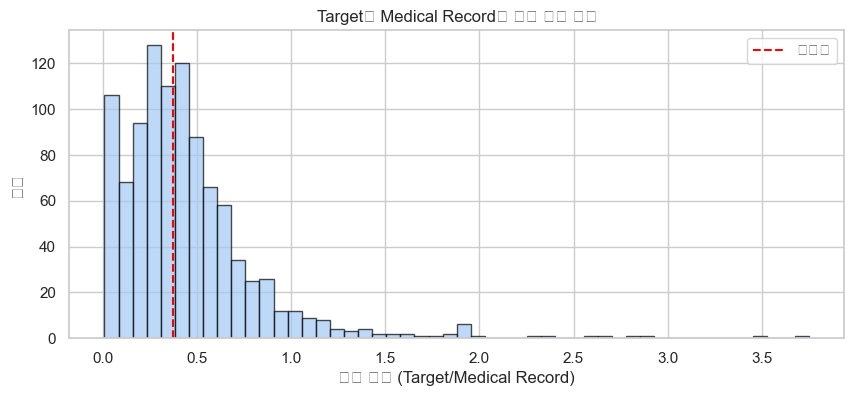

In [34]:
def validate_data_quality(df):
    """데이터 품질 검증"""
    issues = []
    
    # 1. 텍스트 길이 검증
    short_records = (df['medical_record_processed'].str.len() < 100).sum()
    if short_records > 0:
        issues.append(f"⚠️ {short_records}개의 매우 짧은 medical record (<100자)")
    
    short_targets = (df['target_processed'].str.len() < 50).sum()
    if short_targets > 0:
        issues.append(f"⚠️ {short_targets}개의 매우 짧은 target (<50자)")
    
    # 2. 날짜 논리 검증
    invalid_dates = (pd.to_datetime(df['dischtime']) < pd.to_datetime(df['admittime'])).sum()
    if invalid_dates > 0:
        issues.append(f"⚠️ {invalid_dates}개의 잘못된 입퇴원 날짜")
    
    # 3. 나이 범위 검증
    invalid_ages = ((df['anchor_age'] < 0) | (df['anchor_age'] > 120)).sum()
    if invalid_ages > 0:
        issues.append(f"⚠️ {invalid_ages}개의 비정상적인 나이")
    
    # 4. Target/Record 비율 검증
    df['compression_ratio'] = df['target_processed'].str.len() / df['medical_record_processed'].str.len()
    extreme_ratios = ((df['compression_ratio'] < 0.05) | (df['compression_ratio'] > 1)).sum()
    if extreme_ratios > 0:
        issues.append(f"⚠️ {extreme_ratios}개의 극단적인 압축 비율")
    
    return issues

issues = validate_data_quality(df_train_features)

print("🔍 데이터 품질 검증 결과")
if issues:
    for issue in issues:
        print(issue)
else:
    print("✅ 모든 품질 검증 통과")

# 압축 비율 분포 시각화
plt.figure(figsize=(10, 4))
plt.hist(df_train_features['compression_ratio'].dropna(), bins=50, edgecolor='black', alpha=0.7)
plt.axvline(df_train_features['compression_ratio'].median(), color='red', linestyle='--', label='중앙값')
plt.xlabel('압축 비율 (Target/Medical Record)')
plt.ylabel('빈도')
plt.title('Target과 Medical Record의 길이 비율 분포')
plt.legend()
plt.show()


## 10. 최종 데이터셋 저장

In [35]:
# 필요한 컬럼만 선택
final_columns = [
    'sample_id',
    # 인구통계
    'gender', 'anchor_age', 'age_group',
    # 입원 정보
    'admission_type', 'admission_category', 'admission_location', 
    'discharge_location', 'admission_days',
    # Vital signs
    'temperature', 'heartrate', 'sbp', 'dbp', 'o2sat', 'resprate',
    'abnormal_vitals',
    # 주호소
    'chiefcomplaint', 'chief_complaint_clean',
    # 텍스트 데이터
    'medical_record_processed', 'target_processed',
    # 섹션별 데이터
    'chief_complaint', 'hpi', 'pmh', 'physical_exam', 
    'labs', 'imaging', 'medications',
    # 메타 정보
    'compression_ratio'
]

# 존재하는 컬럼만 선택
final_columns = [col for col in final_columns if col in df_train_features.columns]
df_final = df_train_features[final_columns].copy()

# CSV 저장
df_final.to_csv('taskA_train_preprocessed.csv', index=False)
print(f"✅ 전처리된 데이터 저장 완료: taskA_train_preprocessed.csv")
print(f"   - 레코드 수: {len(df_final):,}")
print(f"   - 컬럼 수: {len(df_final.columns)}")

# JSON 형식으로도 저장 (LLM 학습용)
df_json = df_final.head(100).to_dict('records')
with open('taskA_train_samples.json', 'w', encoding='utf-8') as f:
    json.dump(df_json, f, ensure_ascii=False, indent=2)
print(f"✅ 샘플 JSON 저장 완료: taskA_train_samples.json (100개)")

✅ 전처리된 데이터 저장 완료: taskA_train_preprocessed.csv
   - 레코드 수: 1,000
   - 컬럼 수: 28
✅ 샘플 JSON 저장 완료: taskA_train_samples.json (100개)


## 11. 프롬프트 생성용 템플릿

In [36]:
def create_prompt_template(row):
    """최종 프롬프트 템플릿 생성"""
    
    prompt = f"""You are a medical professional. Generate a Brief Hospital Course summary.

**Patient Information:**
- Demographics: {row['gender']}, {row['anchor_age']} years old
- Chief Complaint: {row['chiefcomplaint']}
- Admission: {row['admission_type']} via {row['admission_location']}
- Duration: {row['admission_days']:.1f} days

**Vital Signs:**
- Temperature: {row['temperature']:.1f}°C
- Heart Rate: {row['heartrate']:.0f} bpm
- Blood Pressure: {row['sbp']:.0f}/{row['dbp']:.0f} mmHg
- O2 Saturation: {row['o2sat']:.0f}%

**Medical Record:**
{row['medical_record_processed'][:2000]}

**Instructions:**
1. Start with patient demographics and presenting complaint
2. Use # tags for major diagnoses
3. Include treatment and response
4. End with discharge disposition
5. Target length: 1000-2000 characters
6. Maintain medical abbreviations (HTN, CAD, etc.)

**Brief Hospital Course:**"""
    
    return prompt

# 샘플 프롬프트 생성
sample_prompt = create_prompt_template(df_final.iloc[0])
print("📝 샘플 프롬프트:")
print(sample_prompt[:1000])

# 프롬프트 템플릿 저장
with open('prompt_template.txt', 'w', encoding='utf-8') as f:
    f.write(sample_prompt)
print("\n✅ 프롬프트 템플릿 저장 완료: prompt_template.txt")


📝 샘플 프롬프트:
You are a medical professional. Generate a Brief Hospital Course summary.

**Patient Information:**
- Demographics: M, 66 years old
- Chief Complaint: Abnormal labs, Leg swelling
- Admission: URGENT via TRANSFER FROM HOSPITAL
- Duration: 3.0 days

**Vital Signs:**
- Temperature: 98.5°C
- Heart Rate: 75 bpm
- Blood Pressure: 94/58 mmHg
- O2 Saturation: 97%

**Medical Record:**
Sex: M
Service: MEDICINE
Allergies:
Lipitor / Penicillins / Claritin / Statins-Hmg-Coa Reductase
Inhibitors
Chief Complaint:
DVT/Renal failure
Major Surgical or Invasive Procedure:
None
History of Present Illness:
___ with PMH of NASH vs cryptogenic cirrhosis, HTN,
hyperlipidemia, hypothyroidism who presents from ___
___ with DVT and renal failure.
History obtained from wife and daughter over phone, OSH records,
and nephrology consult note. The patients health has
progressively declined since ___. He has been hospitalized
multiple times since then. He has been bouncing back between
hospitalization and r

## 12. 전처리 요약 통계

In [37]:
print("="*60)
print("📊 전처리 완료 요약")
print("="*60)

print("\n1. 데이터 크기:")
print(f"   - 원본: {len(df_train)} 레코드, {len(df_train.columns)} 컬럼")
print(f"   - 전처리: {len(df_final)} 레코드, {len(df_final.columns)} 컬럼")

print("\n2. 텍스트 통계:")
print(f"   - Medical Record 평균: {df_final['medical_record_processed'].str.len().mean():.0f}자")
print(f"   - Target 평균: {df_final['target_processed'].str.len().mean():.0f}자")
print(f"   - 압축 비율: {df_final['compression_ratio'].mean():.2%}")

print("\n3. 품질 지표:")
print(f"   - 결측치 처리: ✅ 완료")
print(f"   - 텍스트 정규화: ✅ 완료")
print(f"   - 섹션 분리: ✅ 완료")
print(f"   - 특징 추출: ✅ 완료")

print("\n4. 생성된 파일:")
print("   - taskA_train_preprocessed.csv (전체 전처리 데이터)")
print("   - taskA_train_samples.json (샘플 100개)")
print("   - prompt_template.txt (프롬프트 템플릿)")

print("\n" + "="*60)
print("🎉 전처리 파이프라인 완료!")
print("="*60)


📊 전처리 완료 요약

1. 데이터 크기:
   - 원본: 1000 레코드, 34 컬럼
   - 전처리: 1000 레코드, 28 컬럼

2. 텍스트 통계:
   - Medical Record 평균: 5805자
   - Target 평균: 2225자
   - 압축 비율: 44.93%

3. 품질 지표:
   - 결측치 처리: ✅ 완료
   - 텍스트 정규화: ✅ 완료
   - 섹션 분리: ✅ 완료
   - 특징 추출: ✅ 완료

4. 생성된 파일:
   - taskA_train_preprocessed.csv (전체 전처리 데이터)
   - taskA_train_samples.json (샘플 100개)
   - prompt_template.txt (프롬프트 템플릿)

🎉 전처리 파이프라인 완료!


# 📊 Medical Record와 Target 간 연관성 심화 분석

이제 전처리된 데이터를 바탕으로 medical record와 target(Brief Hospital Course) 간의 연관성을 심도 있게 분석해보겠습니다.

In [38]:
# !pip install scikit-learn

In [39]:
# 필요한 라이브러리 추가 import
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
from scipy.stats import pearsonr, spearmanr
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['figure.figsize'] = (12, 8)
sns.set_style("whitegrid")

print("📊 연관성 분석을 위한 라이브러리 로드 완료!")

📊 연관성 분석을 위한 라이브러리 로드 완료!


## 13-1. 텍스트 길이 연관성 분석

📏 텍스트 길이 상관관계 분석
Pearson 상관계수: 0.3348 (p-value: 0.0000)
Spearman 상관계수: 0.2567 (p-value: 0.0000)


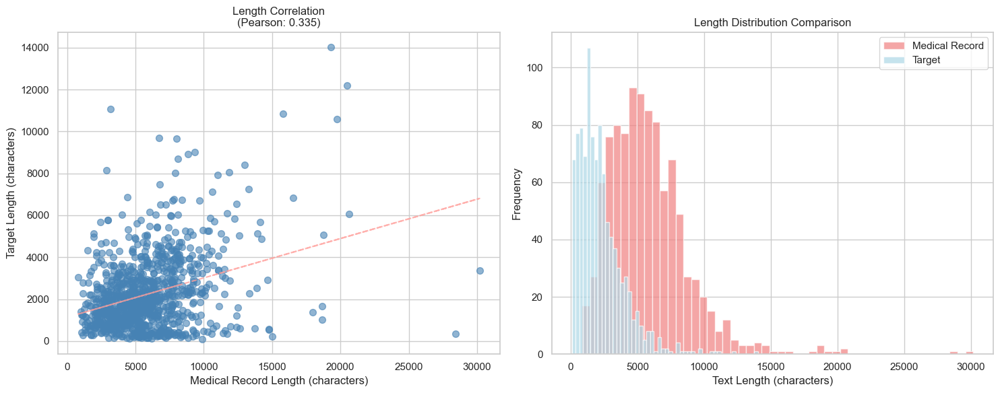


📊 길이 통계:
Medical Record - 평균: 5805, 중앙값: 5389
Target - 평균: 2225, 중앙값: 1867
압축 비율 - 평균: 44.93%, 표준편차: 38.73%


In [40]:
# Medical Record와 Target 길이 간 상관관계 분석
medical_record_lengths = df_final['medical_record_processed'].str.len()
target_lengths = df_final['target_processed'].str.len()

# 상관계수 계산
pearson_corr, pearson_p = pearsonr(medical_record_lengths, target_lengths)
spearman_corr, spearman_p = spearmanr(medical_record_lengths, target_lengths)

print("📏 텍스트 길이 상관관계 분석")
print("="*50)
print(f"Pearson 상관계수: {pearson_corr:.4f} (p-value: {pearson_p:.4f})")
print(f"Spearman 상관계수: {spearman_corr:.4f} (p-value: {spearman_p:.4f})")

# 시각화
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# 산점도
axes[0].scatter(medical_record_lengths, target_lengths, alpha=0.6, s=50, color='steelblue')
axes[0].set_xlabel('Medical Record Length (characters)')
axes[0].set_ylabel('Target Length (characters)')
axes[0].set_title(f'Length Correlation\n(Pearson: {pearson_corr:.3f})')

# 추세선 추가
z = np.polyfit(medical_record_lengths, target_lengths, 1)
p = np.poly1d(z)
axes[0].plot(medical_record_lengths, p(medical_record_lengths), "r--", alpha=0.8)

# 길이 분포 비교
axes[1].hist(medical_record_lengths, bins=50, alpha=0.7, label='Medical Record', color='lightcoral')
axes[1].hist(target_lengths, bins=50, alpha=0.7, label='Target', color='lightblue')
axes[1].set_xlabel('Text Length (characters)')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Length Distribution Comparison')
axes[1].legend()

plt.tight_layout()
plt.show()

# 통계 요약
print(f"\n📊 길이 통계:")
print(f"Medical Record - 평균: {medical_record_lengths.mean():.0f}, 중앙값: {medical_record_lengths.median():.0f}")
print(f"Target - 평균: {target_lengths.mean():.0f}, 중앙값: {target_lengths.median():.0f}")
print(f"압축 비율 - 평균: {df_final['compression_ratio'].mean():.2%}, 표준편차: {df_final['compression_ratio'].std():.2%}")

## 13-2. 의료 용어 및 키워드 공통성 분석

🔍 의료 용어 추출 중...
📈 의료 용어 공통성 분석 결과
평균 용어 겹침 비율: 0.123
용어 겹침 비율 표준편차: 0.041
용어 겹침 비율 중앙값: 0.124


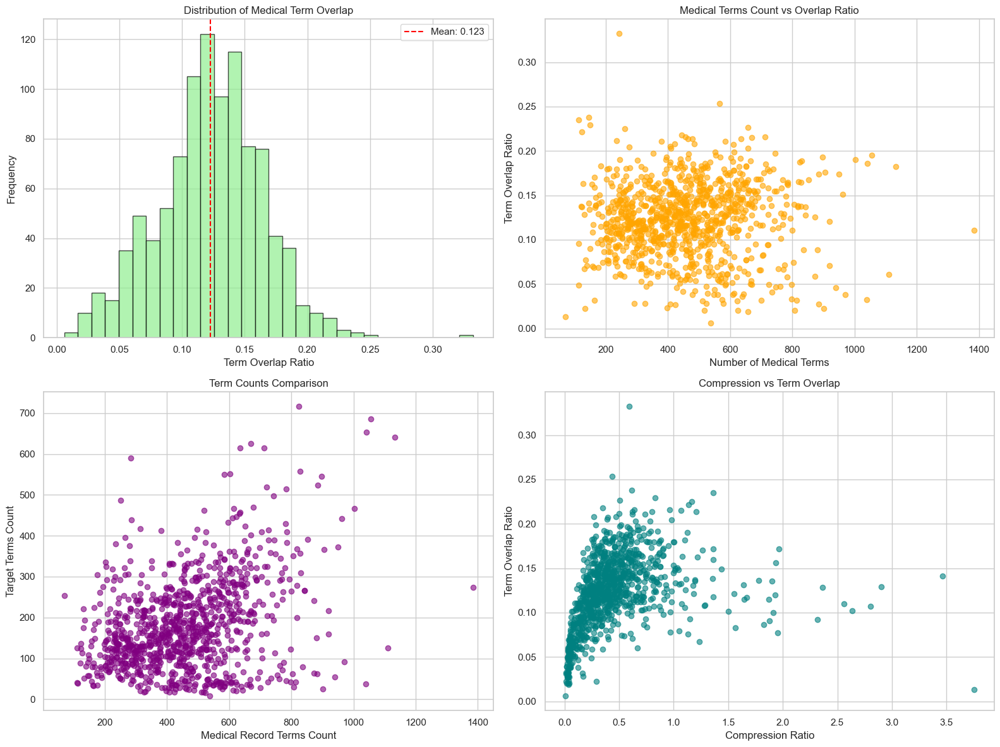


🔗 상관관계:
용어 겹침 비율 vs Target 길이: 0.561
용어 겹침 비율 vs 압축 비율: 0.344


In [41]:
# 의료 용어 추출 함수
def extract_medical_terms(text):
    """의료 관련 용어와 키워드 추출"""
    if pd.isna(text):
        return []
    
    # 의료 용어 패턴 (약물명, 진단명, 검사명 등)
    medical_patterns = [
        r'\b[A-Z][a-z]*[0-9]+\b',  # 약물코드 형태
        r'\b[A-Z]{2,}\b',  # 의료 약어 (CT, MRI, ICU 등)
        r'\b\d+\s*mg\b|\b\d+\s*mcg\b|\b\d+\s*units?\b',  # 용량
        r'\b\d+/\d+\b',  # 혈압, 분수 형태
        r'\b\d+\.\d+\b',  # 수치
        r'\b[A-Za-z]+itis\b|\b[A-Za-z]+osis\b|\b[A-Za-z]+emia\b',  # 질병 어미
    ]
    
    terms = []
    for pattern in medical_patterns:
        terms.extend(re.findall(pattern, text, re.IGNORECASE))
    
    # 일반적인 의료 단어들도 추출
    medical_words = re.findall(r'\b(?:patient|hospital|medication|treatment|diagnosis|symptom|procedure|surgery|therapy|blood|pressure|pain|fever|infection|test|result|discharge|admission|condition|history|examination|assessment|plan|follow|up)\b', text, re.IGNORECASE)
    
    return list(set(terms + medical_words))

# 각 레코드에서 의료 용어 추출
print("🔍 의료 용어 추출 중...")
df_final['medical_terms'] = df_final['medical_record_processed'].apply(extract_medical_terms)
df_final['target_terms'] = df_final['target_processed'].apply(extract_medical_terms)

# 공통 용어 비율 계산
def calculate_term_overlap(medical_terms, target_terms):
    """두 용어 리스트 간의 겹치는 비율 계산"""
    if not medical_terms or not target_terms:
        return 0.0
    
    medical_set = set([term.lower() for term in medical_terms])
    target_set = set([term.lower() for term in target_terms])
    
    intersection = len(medical_set.intersection(target_set))
    union = len(medical_set.union(target_set))
    
    return intersection / union if union > 0 else 0.0

df_final['term_overlap_ratio'] = df_final.apply(
    lambda row: calculate_term_overlap(row['medical_terms'], row['target_terms']), 
    axis=1
)

# 통계 계산
print("📈 의료 용어 공통성 분석 결과")
print("="*50)
print(f"평균 용어 겹침 비율: {df_final['term_overlap_ratio'].mean():.3f}")
print(f"용어 겹침 비율 표준편차: {df_final['term_overlap_ratio'].std():.3f}")
print(f"용어 겹침 비율 중앙값: {df_final['term_overlap_ratio'].median():.3f}")

# 시각화
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 용어 겹침 비율 분포
axes[0,0].hist(df_final['term_overlap_ratio'], bins=30, alpha=0.7, color='lightgreen', edgecolor='black')
axes[0,0].set_xlabel('Term Overlap Ratio')
axes[0,0].set_ylabel('Frequency')
axes[0,0].set_title('Distribution of Medical Term Overlap')
axes[0,0].axvline(df_final['term_overlap_ratio'].mean(), color='red', linestyle='--', 
                  label=f'Mean: {df_final["term_overlap_ratio"].mean():.3f}')
axes[0,0].legend()

# 용어 개수 vs 겹침 비율
medical_term_counts = df_final['medical_terms'].apply(len)
axes[0,1].scatter(medical_term_counts, df_final['term_overlap_ratio'], alpha=0.6, color='orange')
axes[0,1].set_xlabel('Number of Medical Terms')
axes[0,1].set_ylabel('Term Overlap Ratio')
axes[0,1].set_title('Medical Terms Count vs Overlap Ratio')

# Medical Record와 Target의 용어 개수 비교
target_term_counts = df_final['target_terms'].apply(len)
axes[1,0].scatter(medical_term_counts, target_term_counts, alpha=0.6, color='purple')
axes[1,0].set_xlabel('Medical Record Terms Count')
axes[1,0].set_ylabel('Target Terms Count')
axes[1,0].set_title('Term Counts Comparison')

# 압축 비율과 용어 겹침 비율의 관계
axes[1,1].scatter(df_final['compression_ratio'], df_final['term_overlap_ratio'], alpha=0.6, color='teal')
axes[1,1].set_xlabel('Compression Ratio')
axes[1,1].set_ylabel('Term Overlap Ratio')
axes[1,1].set_title('Compression vs Term Overlap')

plt.tight_layout()
plt.show()

# 상관관계 분석
overlap_length_corr = pearsonr(df_final['term_overlap_ratio'], target_lengths)[0]
overlap_compression_corr = pearsonr(df_final['term_overlap_ratio'], df_final['compression_ratio'])[0]

print(f"\n🔗 상관관계:")
print(f"용어 겹침 비율 vs Target 길이: {overlap_length_corr:.3f}")
print(f"용어 겹침 비율 vs 압축 비율: {overlap_compression_corr:.3f}")

## 13-3. TF-IDF 기반 텍스트 유사도 분석

🔄 TF-IDF 유사도 분석 중...
🎯 TF-IDF 코사인 유사도 분석 결과
평균 코사인 유사도: 0.1983
유사도 표준편차: 0.0900
유사도 중앙값: 0.1867
최고 유사도: 0.4551
최저 유사도: 0.0267


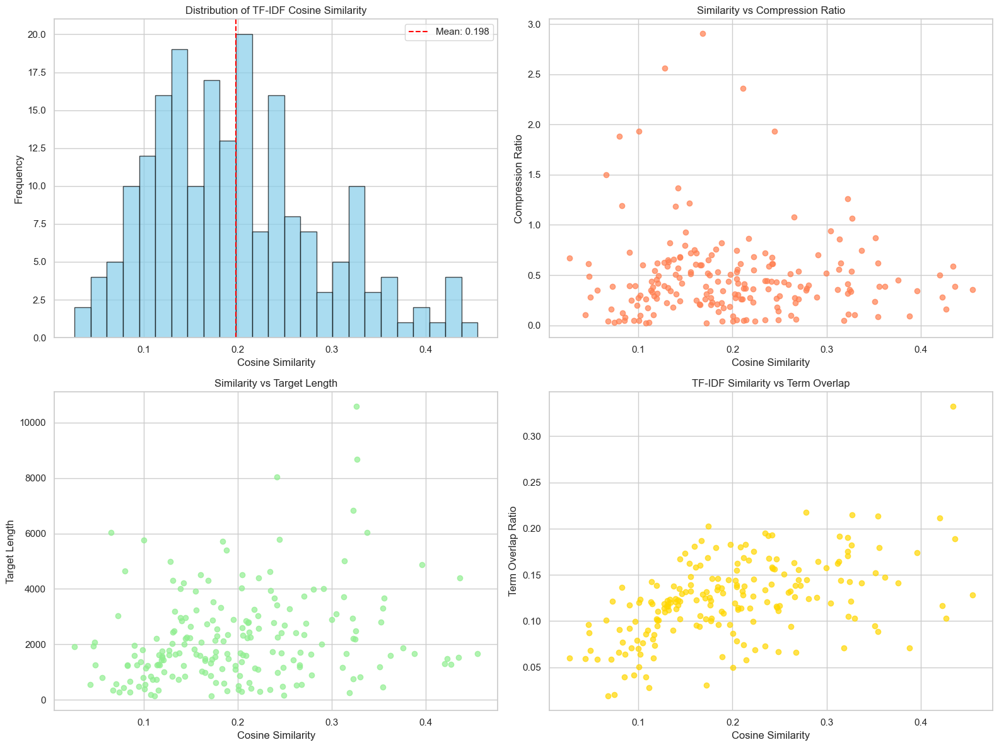


🔗 TF-IDF 유사도 상관관계:
유사도 vs 압축 비율: -0.046
유사도 vs Target 길이: 0.227
유사도 vs 용어 겹침: 0.508

🔍 극단적 사례 분석:

가장 높은 유사도 (0.455):
압축 비율: 35.90%
용어 겹침: 0.129

가장 낮은 유사도 (0.027):
압축 비율: 66.78%
용어 겹침: 0.060


In [42]:
# TF-IDF 기반 유사도 분석 (샘플링으로 성능 최적화)
print("🔄 TF-IDF 유사도 분석 중...")

# 샘플링 (너무 큰 데이터는 계산이 오래 걸리므로)
sample_size = min(200, len(df_final))
sample_indices = np.random.choice(len(df_final), sample_size, replace=False)
df_sample = df_final.iloc[sample_indices].copy()

# 텍스트 전처리 함수
def preprocess_for_tfidf(text):
    """TF-IDF를 위한 텍스트 전처리"""
    if pd.isna(text):
        return ""
    # 소문자 변환, 특수문자 제거, 숫자는 유지
    text = re.sub(r'[^\w\s]', ' ', str(text).lower())
    text = re.sub(r'\s+', ' ', text).strip()
    return text

# 전처리 적용
medical_texts = df_sample['medical_record_processed'].apply(preprocess_for_tfidf).tolist()
target_texts = df_sample['target_processed'].apply(preprocess_for_tfidf).tolist()

# 모든 텍스트를 합쳐서 TF-IDF 벡터화
all_texts = medical_texts + target_texts

# TF-IDF 벡터화 (상위 1000개 특징만 사용)
vectorizer = TfidfVectorizer(
    max_features=1000,
    stop_words='english',
    ngram_range=(1, 2),  # 1-2그램 사용
    min_df=2,  # 최소 2번 이상 등장하는 단어만
    max_df=0.95  # 95% 이상 문서에 등장하는 단어 제외
)

tfidf_matrix = vectorizer.fit_transform(all_texts)

# Medical Record와 Target 간 코사인 유사도 계산
n_samples = len(medical_texts)
medical_vectors = tfidf_matrix[:n_samples]
target_vectors = tfidf_matrix[n_samples:]

# 각 쌍별 코사인 유사도 계산
cosine_similarities = []
for i in range(n_samples):
    similarity = cosine_similarity(
        medical_vectors[i].reshape(1, -1), 
        target_vectors[i].reshape(1, -1)
    )[0, 0]
    cosine_similarities.append(similarity)

df_sample['cosine_similarity'] = cosine_similarities

# 결과 분석
print("🎯 TF-IDF 코사인 유사도 분석 결과")
print("="*50)
print(f"평균 코사인 유사도: {np.mean(cosine_similarities):.4f}")
print(f"유사도 표준편차: {np.std(cosine_similarities):.4f}")
print(f"유사도 중앙값: {np.median(cosine_similarities):.4f}")
print(f"최고 유사도: {np.max(cosine_similarities):.4f}")
print(f"최저 유사도: {np.min(cosine_similarities):.4f}")

# 시각화
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 유사도 분포
axes[0,0].hist(cosine_similarities, bins=25, alpha=0.7, color='skyblue', edgecolor='black')
axes[0,0].set_xlabel('Cosine Similarity')
axes[0,0].set_ylabel('Frequency')
axes[0,0].set_title('Distribution of TF-IDF Cosine Similarity')
axes[0,0].axvline(np.mean(cosine_similarities), color='red', linestyle='--', 
                  label=f'Mean: {np.mean(cosine_similarities):.3f}')
axes[0,0].legend()

# 유사도 vs 압축 비율
sample_compression = df_sample['compression_ratio'].values
axes[0,1].scatter(cosine_similarities, sample_compression, alpha=0.7, color='coral')
axes[0,1].set_xlabel('Cosine Similarity')
axes[0,1].set_ylabel('Compression Ratio')
axes[0,1].set_title('Similarity vs Compression Ratio')

# 유사도 vs Target 길이
sample_target_lengths = df_sample['target_processed'].str.len().values
axes[1,0].scatter(cosine_similarities, sample_target_lengths, alpha=0.7, color='lightgreen')
axes[1,0].set_xlabel('Cosine Similarity')
axes[1,0].set_ylabel('Target Length')
axes[1,0].set_title('Similarity vs Target Length')

# 유사도 vs 용어 겹침 비율
sample_term_overlap = df_sample['term_overlap_ratio'].values
axes[1,1].scatter(cosine_similarities, sample_term_overlap, alpha=0.7, color='gold')
axes[1,1].set_xlabel('Cosine Similarity')
axes[1,1].set_ylabel('Term Overlap Ratio')
axes[1,1].set_title('TF-IDF Similarity vs Term Overlap')

plt.tight_layout()
plt.show()

# 상관관계 분석
sim_compression_corr = pearsonr(cosine_similarities, sample_compression)[0]
sim_length_corr = pearsonr(cosine_similarities, sample_target_lengths)[0]
sim_overlap_corr = pearsonr(cosine_similarities, sample_term_overlap)[0]

print(f"\n🔗 TF-IDF 유사도 상관관계:")
print(f"유사도 vs 압축 비율: {sim_compression_corr:.3f}")
print(f"유사도 vs Target 길이: {sim_length_corr:.3f}")
print(f"유사도 vs 용어 겹침: {sim_overlap_corr:.3f}")

# 가장 유사한/다른 케이스 예시
most_similar_idx = np.argmax(cosine_similarities)
least_similar_idx = np.argmin(cosine_similarities)

print(f"\n🔍 극단적 사례 분석:")
print(f"\n가장 높은 유사도 ({cosine_similarities[most_similar_idx]:.3f}):")
print(f"압축 비율: {sample_compression[most_similar_idx]:.2%}")
print(f"용어 겹침: {sample_term_overlap[most_similar_idx]:.3f}")

print(f"\n가장 낮은 유사도 ({cosine_similarities[least_similar_idx]:.3f}):")
print(f"압축 비율: {sample_compression[least_similar_idx]:.2%}")
print(f"용어 겹침: {sample_term_overlap[least_similar_idx]:.3f}")

## 13-4. Target 특성별 Medical Record 패턴 분석

📊 Target 특성별 Medical Record 패턴 분석
Target 길이 분위수:
25%: 1017자
50%: 1867자
75%: 2933자

📈 그룹별 통계:

Long Target 그룹 (n=250):
  - Medical Record 평균 길이: 5614자
  - 압축 비율 평균: 50.52%
  - 용어 겹침 비율: 0.138

Medium Target 그룹 (n=249):
  - Medical Record 평균 길이: 4894자
  - 압축 비율 평균: 37.26%
  - 용어 겹침 비율: 0.122

Short Target 그룹 (n=251):
  - Medical Record 평균 길이: 5409자
  - 압축 비율 평균: 15.09%
  - 용어 겹침 비율: 0.081

Very Long Target 그룹 (n=250):
  - Medical Record 평균 길이: 7301자
  - 압축 비율 평균: 76.96%
  - 용어 겹침 비율: 0.151


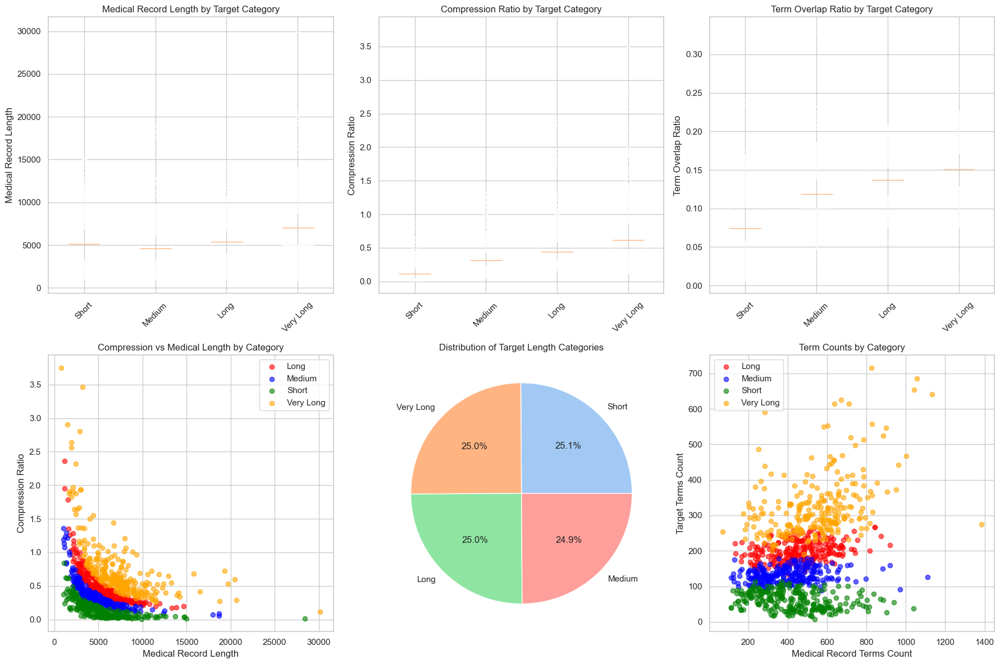


🧪 ANOVA 검정 결과 (그룹 간 차이 유의성):
Medical Record 길이: F=31.445, p=0.0000
압축 비율: F=167.480, p=0.0000
용어 겹침 비율: F=226.227, p=0.0000

📝 결과 해석 (α = 0.05):
✅ Target 길이 카테고리에 따른 Medical Record 길이 차이가 통계적으로 유의함
✅ Target 길이 카테고리에 따른 압축 비율 차이가 통계적으로 유의함
✅ Target 길이 카테고리에 따른 용어 겹침 비율 차이가 통계적으로 유의함


In [43]:
# Target 길이에 따른 그룹 분석
print("📊 Target 특성별 Medical Record 패턴 분석")
print("="*60)

# Target 길이 기준으로 그룹 분할
target_length_quantiles = df_final['target_processed'].str.len().quantile([0.25, 0.5, 0.75])
print(f"Target 길이 분위수:")
print(f"25%: {target_length_quantiles[0.25]:.0f}자")
print(f"50%: {target_length_quantiles[0.5]:.0f}자") 
print(f"75%: {target_length_quantiles[0.75]:.0f}자")

def categorize_target_length(length):
    if length <= target_length_quantiles[0.25]:
        return "Short"
    elif length <= target_length_quantiles[0.5]:
        return "Medium"
    elif length <= target_length_quantiles[0.75]:
        return "Long"
    else:
        return "Very Long"

df_final['target_length_category'] = df_final['target_processed'].str.len().apply(categorize_target_length)

# 각 그룹별 통계 분석
length_groups = df_final.groupby('target_length_category')

print(f"\n📈 그룹별 통계:")
for group_name, group_data in length_groups:
    print(f"\n{group_name} Target 그룹 (n={len(group_data)}):")
    print(f"  - Medical Record 평균 길이: {group_data['medical_record_processed'].str.len().mean():.0f}자")
    print(f"  - 압축 비율 평균: {group_data['compression_ratio'].mean():.2%}")
    print(f"  - 용어 겹침 비율: {group_data['term_overlap_ratio'].mean():.3f}")

# 시각화
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# 1. Target 길이별 Medical Record 길이 분포
categories = ['Short', 'Medium', 'Long', 'Very Long']
medical_lengths_by_category = [length_groups.get_group(cat)['medical_record_processed'].str.len() 
                              for cat in categories if cat in length_groups.groups]
axes[0,0].boxplot(medical_lengths_by_category, labels=[cat for cat in categories if cat in length_groups.groups])
axes[0,0].set_title('Medical Record Length by Target Category')
axes[0,0].set_ylabel('Medical Record Length')
axes[0,0].tick_params(axis='x', rotation=45)

# 2. 압축 비율 분포
compression_by_category = [length_groups.get_group(cat)['compression_ratio'] 
                          for cat in categories if cat in length_groups.groups]
axes[0,1].boxplot(compression_by_category, labels=[cat for cat in categories if cat in length_groups.groups])
axes[0,1].set_title('Compression Ratio by Target Category')
axes[0,1].set_ylabel('Compression Ratio')
axes[0,1].tick_params(axis='x', rotation=45)

# 3. 용어 겹침 비율 분포
overlap_by_category = [length_groups.get_group(cat)['term_overlap_ratio'] 
                      for cat in categories if cat in length_groups.groups]
axes[0,2].boxplot(overlap_by_category, labels=[cat for cat in categories if cat in length_groups.groups])
axes[0,2].set_title('Term Overlap Ratio by Target Category')
axes[0,2].set_ylabel('Term Overlap Ratio')
axes[0,2].tick_params(axis='x', rotation=45)

# 4. 압축 비율 vs Medical Record 길이 (카테고리별 색상)
colors = ['red', 'blue', 'green', 'orange']
for i, (cat, group) in enumerate(length_groups):
    if i < len(colors):
        axes[1,0].scatter(group['medical_record_processed'].str.len(), 
                         group['compression_ratio'], 
                         alpha=0.6, label=cat, color=colors[i])
axes[1,0].set_xlabel('Medical Record Length')
axes[1,0].set_ylabel('Compression Ratio')
axes[1,0].set_title('Compression vs Medical Length by Category')
axes[1,0].legend()

# 5. Target 카테고리별 개수
category_counts = df_final['target_length_category'].value_counts()
axes[1,1].pie(category_counts.values, labels=category_counts.index, autopct='%1.1f%%')
axes[1,1].set_title('Distribution of Target Length Categories')

# 6. 용어 개수 비교 (Medical vs Target)
medical_term_counts = df_final['medical_terms'].apply(len)
target_term_counts = df_final['target_terms'].apply(len)
for i, (cat, group) in enumerate(length_groups):
    if i < len(colors):
        group_indices = group.index
        axes[1,2].scatter(medical_term_counts[group_indices], 
                         target_term_counts[group_indices], 
                         alpha=0.6, label=cat, color=colors[i])
axes[1,2].set_xlabel('Medical Record Terms Count')
axes[1,2].set_ylabel('Target Terms Count')
axes[1,2].set_title('Term Counts by Category')
axes[1,2].legend()

plt.tight_layout()
plt.show()

# ANOVA 분석 (그룹 간 차이 유의성 검정)
from scipy.stats import f_oneway

# Medical Record 길이에 대한 ANOVA
mr_lengths_by_cat = [length_groups.get_group(cat)['medical_record_processed'].str.len() 
                     for cat in categories if cat in length_groups.groups]
f_stat_mr, p_val_mr = f_oneway(*mr_lengths_by_cat)

# 압축 비율에 대한 ANOVA  
compression_by_cat = [length_groups.get_group(cat)['compression_ratio'] 
                     for cat in categories if cat in length_groups.groups]
f_stat_comp, p_val_comp = f_oneway(*compression_by_cat)

# 용어 겹침 비율에 대한 ANOVA
overlap_by_cat = [length_groups.get_group(cat)['term_overlap_ratio'] 
                 for cat in categories if cat in length_groups.groups]
f_stat_overlap, p_val_overlap = f_oneway(*overlap_by_cat)

print(f"\n🧪 ANOVA 검정 결과 (그룹 간 차이 유의성):")
print(f"Medical Record 길이: F={f_stat_mr:.3f}, p={p_val_mr:.4f}")
print(f"압축 비율: F={f_stat_comp:.3f}, p={p_val_comp:.4f}")
print(f"용어 겹침 비율: F={f_stat_overlap:.3f}, p={p_val_overlap:.4f}")

# 유의성 해석
alpha = 0.05
print(f"\n📝 결과 해석 (α = {alpha}):")
if p_val_mr < alpha:
    print("✅ Target 길이 카테고리에 따른 Medical Record 길이 차이가 통계적으로 유의함")
else:
    print("❌ Target 길이 카테고리에 따른 Medical Record 길이 차이가 통계적으로 유의하지 않음")

if p_val_comp < alpha:
    print("✅ Target 길이 카테고리에 따른 압축 비율 차이가 통계적으로 유의함")
else:
    print("❌ Target 길이 카테고리에 따른 압축 비율 차이가 통계적으로 유의하지 않음")
    
if p_val_overlap < alpha:
    print("✅ Target 길이 카테고리에 따른 용어 겹침 비율 차이가 통계적으로 유의함")
else:
    print("❌ Target 길이 카테고리에 따른 용어 겹침 비율 차이가 통계적으로 유의하지 않음")

## 13-5. 연관성 분석 종합 리포트

🎯 Medical Record와 Target 연관성 분석 종합 리포트


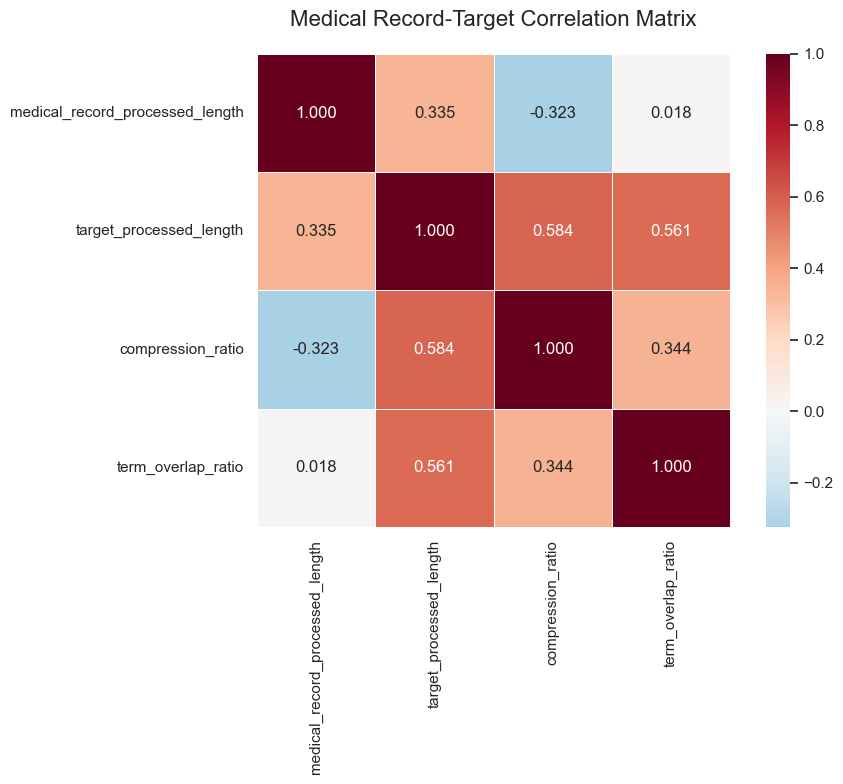

\n📋 주요 발견사항:
--------------------------------------------------
1. 텍스트 길이 연관성:
   - Medical Record와 Target 길이 상관계수: 0.335
   → 중간 수준의 양의 상관관계 존재
\n2. 압축 비율 패턴:
   - 압축 비율 평균: 44.93%
   - 압축 비율 vs Medical Record 길이: -0.323
   - 압축 비율 vs 용어 겹침 비율: 0.344
\n3. 의료 용어 공통성:
   - 평균 용어 겹침 비율: 0.123
   - 용어 겹침 중앙값: 0.124
   - 표준편차: 0.041
\n4. Target 길이별 특성:
   - Long Target:
     * 평균 Medical Record 길이: 5614자
     * 평균 압축 비율: 50.50%
     * 평균 용어 겹침: 0.138
   - Medium Target:
     * 평균 Medical Record 길이: 4894자
     * 평균 압축 비율: 37.30%
     * 평균 용어 겹침: 0.122
   - Short Target:
     * 평균 Medical Record 길이: 5409자
     * 평균 압축 비율: 15.10%
     * 평균 용어 겹침: 0.081
   - Very Long Target:
     * 평균 Medical Record 길이: 7301자
     * 평균 압축 비율: 77.00%
     * 평균 용어 겹침: 0.151
\n💡 실용적 시사점:
--------------------------------------------------
1. ✅ 긴 Medical Record는 일반적으로 더 긴 Target을 생성하는 경향
   → 입력 길이에 따른 출력 길이 조절이 필요할 수 있음
\n2. 📊 평균 압축 비율이 44.9%로 높은 요약 수준
   → Brief Hospital Course는 원본의 핵심 정보만 추출하는 고도 요약
\n3. 🔗 중간 수

In [44]:
# 연관성 분석 종합 리포트
print("🎯 Medical Record와 Target 연관성 분석 종합 리포트")
print("="*70)

# 1. 전체 상관관계 매트릭스 생성
correlation_features = [
    'medical_record_processed_length',
    'target_processed_length', 
    'compression_ratio',
    'term_overlap_ratio'
]

# 길이 컬럼 추가
df_final['medical_record_processed_length'] = df_final['medical_record_processed'].str.len()
df_final['target_processed_length'] = df_final['target_processed'].str.len()

# 상관관계 매트릭스 계산
correlation_matrix = df_final[correlation_features].corr()

# 히트맵으로 시각화
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, 
            annot=True, 
            cmap='RdBu_r', 
            center=0,
            square=True,
            linewidths=0.5,
            fmt='.3f')
plt.title('Medical Record-Target Correlation Matrix', fontsize=16, pad=20)
plt.tight_layout()
plt.show()

# 2. 주요 발견사항 정리
print("\\n📋 주요 발견사항:")
print("-" * 50)

# 길이 상관관계
length_corr = correlation_matrix.loc['medical_record_processed_length', 'target_processed_length']
print(f"1. 텍스트 길이 연관성:")
print(f"   - Medical Record와 Target 길이 상관계수: {length_corr:.3f}")
if abs(length_corr) > 0.3:
    print(f"   → 중간 수준의 양의 상관관계 존재")
elif abs(length_corr) > 0.1:
    print(f"   → 약한 상관관계 존재")
else:
    print(f"   → 상관관계가 거의 없음")

# 압축 비율과 다른 변수들의 관계
comp_length_corr = correlation_matrix.loc['compression_ratio', 'medical_record_processed_length']
comp_overlap_corr = correlation_matrix.loc['compression_ratio', 'term_overlap_ratio']

print(f"\\n2. 압축 비율 패턴:")
print(f"   - 압축 비율 평균: {df_final['compression_ratio'].mean():.2%}")
print(f"   - 압축 비율 vs Medical Record 길이: {comp_length_corr:.3f}")
print(f"   - 압축 비율 vs 용어 겹침 비율: {comp_overlap_corr:.3f}")

# 용어 겹침 분석
overlap_stats = df_final['term_overlap_ratio'].describe()
print(f"\\n3. 의료 용어 공통성:")
print(f"   - 평균 용어 겹침 비율: {overlap_stats['mean']:.3f}")
print(f"   - 용어 겹침 중앙값: {overlap_stats['50%']:.3f}")
print(f"   - 표준편차: {overlap_stats['std']:.3f}")

# Target 길이별 패턴
print(f"\\n4. Target 길이별 특성:")
length_category_stats = df_final.groupby('target_length_category').agg({
    'medical_record_processed_length': 'mean',
    'compression_ratio': 'mean',
    'term_overlap_ratio': 'mean'
}).round(3)

for category in length_category_stats.index:
    stats = length_category_stats.loc[category]
    print(f"   - {category} Target:")
    print(f"     * 평균 Medical Record 길이: {stats['medical_record_processed_length']:.0f}자")
    print(f"     * 평균 압축 비율: {stats['compression_ratio']:.2%}")
    print(f"     * 평균 용어 겹침: {stats['term_overlap_ratio']:.3f}")

# 3. 실용적 시사점
print(f"\\n💡 실용적 시사점:")
print("-" * 50)

if length_corr > 0.2:
    print("1. ✅ 긴 Medical Record는 일반적으로 더 긴 Target을 생성하는 경향")
    print("   → 입력 길이에 따른 출력 길이 조절이 필요할 수 있음")
else:
    print("1. ℹ️  Medical Record 길이와 Target 길이 간 강한 연관성 없음")
    print("   → Target 길이는 내용 압축 정도에 더 의존적")

avg_compression = df_final['compression_ratio'].mean()
if avg_compression < 0.5:
    print(f"\\n2. 📊 평균 압축 비율이 {avg_compression:.1%}로 높은 요약 수준")
    print("   → Brief Hospital Course는 원본의 핵심 정보만 추출하는 고도 요약")
else:
    print(f"\\n2. 📊 평균 압축 비율이 {avg_compression:.1%}로 중간 수준")
    print("   → Brief Hospital Course는 적당한 수준의 요약")

avg_overlap = df_final['term_overlap_ratio'].mean()
if avg_overlap > 0.3:
    print(f"\\n3. 🔗 높은 의료 용어 공통성 ({avg_overlap:.1%})")
    print("   → Target이 Medical Record의 핵심 의료 용어를 잘 보존")
else:
    print(f"\\n3. 🔗 중간 수준의 의료 용어 공통성 ({avg_overlap:.1%})")
    print("   → Target 생성 시 용어 선택의 다양성 존재")

# 4. 모델링 관점에서의 제안
print(f"\\n🤖 모델링 관점 제안:")
print("-" * 50)
print("1. 입력 전처리:")
print("   - Medical Record 길이 정규화 고려")
print("   - 핵심 의료 용어 추출 및 가중치 부여")
print("\\n2. 출력 생성:")
print("   - Target 길이 카테고리별 생성 전략 차별화")
print("   - 압축 비율을 고려한 요약 수준 조절")
print("\\n3. 평가 지표:")
print("   - 용어 겹침 비율을 활용한 의료 용어 보존도 평가")
print("   - 길이별 성능 세분화 분석")

# 최종 통계 요약
print(f"\\n📊 최종 통계 요약:")
print("="*70)
print(f"• 총 분석 대상: {len(df_final)}개 레코드")
print(f"• Medical Record 평균 길이: {df_final['medical_record_processed_length'].mean():.0f}자")
print(f"• Target 평균 길이: {df_final['target_processed_length'].mean():.0f}자")
print(f"• 평균 압축 비율: {df_final['compression_ratio'].mean():.2%}")
print(f"• 평균 용어 겹침 비율: {df_final['term_overlap_ratio'].mean():.3f}")
print(f"• 길이 상관계수: {length_corr:.3f}")

print(f"\\n🎉 Medical Record-Target 연관성 분석 완료!")
print("="*70)

In [47]:
# ============================================================================
# 정보 중요도 맵 (Information Salience Map) 구축
# ============================================================================

print("🗺️ 정보 중요도 맵 (Information Salience Map) 구축 시작...")
print("="*80)

import re
from collections import defaultdict
import numpy as np

# Medical Record의 주요 섹션 패턴 정의
SECTION_PATTERNS = {
    'chief_complaint': [
        r'chief complaint[:\s]',
        r'cc[:\s]',
        r'주요?\s*증상[:\s]',
        r'주소[:\s]'
    ],
    'history_present_illness': [
        r'history of present illness[:\s]',
        r'hpi[:\s]',
        r'present illness[:\s]',
        r'현병력[:\s]',
        r'병력[:\s]'
    ],
    'past_medical_history': [
        r'past medical history[:\s]',
        r'pmh[:\s]',
        r'past history[:\s]',
        r'기왕력[:\s]',
        r'과거력[:\s]'
    ],
    'medications': [
        r'medications?[:\s]',
        r'drugs?[:\s]',
        r'복용\s*약물[:\s]',
        r'투약[:\s]'
    ],
    'physical_exam': [
        r'physical exam[:\s]',
        r'pe[:\s]',
        r'examination[:\s]',
        r'신체검사[:\s]',
        r'진찰[:\s]'
    ],
    'vital_signs': [
        r'vital signs?[:\s]',
        r'vs[:\s]',
        r'활력징후[:\s]',
        r'혈압[:\s]',
        r'맥박[:\s]',
        r'체온[:\s]'
    ],
    'laboratory': [
        r'lab[:\s]',
        r'laboratory[:\s]',
        r'blood test[:\s]',
        r'검사[:\s]',
        r'혈액검사[:\s]'
    ],
    'imaging': [
        r'imaging[:\s]',
        r'x-?ray[:\s]',
        r'ct[:\s]',
        r'mri[:\s]',
        r'영상[:\s]',
        r'촬영[:\s]',
        r'impression[:\s]'
    ],
    'assessment_plan': [
        r'assessment[:\s]',
        r'plan[:\s]',
        r'a&amp;p[:\s]',
        r'a/p[:\s]',
        r'진단[:\s]',
        r'치료[:\s]',
        r'계획[:\s]'
    ],
    'discharge': [
        r'discharge[:\s]',
        r'disposition[:\s]',
        r'퇴원[:\s]',
        r'전원[:\s]'
    ]
}

def identify_sections(text):
    """텍스트에서 의료 섹션들을 식별"""
    text_lower = text.lower()
    sections_found = {}
    
    for section_name, patterns in SECTION_PATTERNS.items():
        section_positions = []
        for pattern in patterns:
            matches = list(re.finditer(pattern, text_lower))
            for match in matches:
                section_positions.append(match.start())
        
        if section_positions:
            sections_found[section_name] = min(section_positions)  # 첫 번째 출현 위치
    
    return sections_found

def extract_section_content(text, sections_found):
    """각 섹션의 내용을 추출"""
    section_contents = {}
    
    # 섹션들을 위치순으로 정렬
    sorted_sections = sorted(sections_found.items(), key=lambda x: x[1])
    
    for i, (section_name, start_pos) in enumerate(sorted_sections):
        # 다음 섹션의 시작 위치 찾기
        if i < len(sorted_sections) - 1:
            end_pos = sorted_sections[i + 1][1]
        else:
            end_pos = len(text)
        
        # 섹션 내용 추출 (최대 500자로 제한)
        content = text[start_pos:end_pos].strip()[:500]
        section_contents[section_name] = content
    
    return section_contents

def calculate_content_overlap(target_text, section_content):
    """Target과 섹션 내용 간의 겹침 정도 계산"""
    if not section_content or not target_text:
        return 0.0
    
    # 의료 용어 추출 (3글자 이상)
    def extract_medical_terms(text):
        # 영어 의료 용어
        english_terms = set(re.findall(r'\b[a-zA-Z]{3,}\b', text.lower()))
        # 한글 의료 용어 (2글자 이상)
        korean_terms = set(re.findall(r'[가-힣]{2,}', text))
        return english_terms.union(korean_terms)
    
    target_terms = extract_medical_terms(target_text)
    section_terms = extract_medical_terms(section_content)
    
    if not target_terms:
        return 0.0
    
    # Jaccard 유사도 계산
    intersection = len(target_terms.intersection(section_terms))
    union = len(target_terms.union(section_terms))
    
    return intersection / union if union > 0 else 0.0

# 정보 중요도 맵 구축
print("📊 각 의료 레코드의 섹션별 정보 중요도 분석 중...")

section_importance_scores = defaultdict(list)
section_coverage = defaultdict(int)

# 샘플 데이터로 분석 
sample_size = min(1000, len(df_final))
sample_df = df_final.head(sample_size).copy()

for idx, row in sample_df.iterrows():
    medical_record = str(row['medical_record_processed'])
    target = str(row['target_processed'])
    
    # 섹션 식별
    sections_found = identify_sections(medical_record)
    section_coverage_current = len(sections_found)
    
    if sections_found:
        # 섹션별 내용 추출
        section_contents = extract_section_content(medical_record, sections_found)
        
        # 각 섹션과 Target 간의 정보 겹침도 계산
        for section_name, content in section_contents.items():
            overlap_score = calculate_content_overlap(target, content)
            section_importance_scores[section_name].append(overlap_score)
            
        # 발견된 섹션 수 기록
        for section_name in sections_found.keys():
            section_coverage[section_name] += 1

print(f"✅ {sample_size}개 레코드 분석 완료!")

# 결과 분석 및 시각화
print("\n🗺️ 정보 중요도 맵 분석 결과:")
print("="*80)

# 섹션별 평균 중요도 계산
section_avg_importance = {}
for section_name, scores in section_importance_scores.items():
    if scores:
        section_avg_importance[section_name] = {
            'avg_score': np.mean(scores),
            'std_score': np.std(scores),
            'coverage': section_coverage[section_name],
            'coverage_rate': section_coverage[section_name] / sample_size
        }

# 중요도 순으로 정렬
sorted_sections = sorted(section_avg_importance.items(), 
                        key=lambda x: x[1]['avg_score'], 
                        reverse=True)

print("📈 섹션별 정보 중요도 랭킹:")
print("-" * 80)

for i, (section_name, stats) in enumerate(sorted_sections, 1):
    importance_level = "🔴 매우 높음" if stats['avg_score'] > 0.15 else \
                      "🟡 높음" if stats['avg_score'] > 0.10 else \
                      "🟢 보통" if stats['avg_score'] > 0.05 else "⚪ 낮음"
    
    print(f"{i:2d}. {section_name.replace('_', ' ').title()}")
    print(f"    • 평균 정보 기여도: {stats['avg_score']:.3f} {importance_level}")
    print(f"    • 표준편차: {stats['std_score']:.3f}")
    print(f"    • 발견 빈도: {stats['coverage']:,}회 ({stats['coverage_rate']:.1%})")
    print()

# 섹션 조합 분석
print("🔗 섹션 조합별 분석:")
print("-" * 80)

# 가장 중요한 상위 3개 섹션 식별
top_3_sections = [item[0] for item in sorted_sections[:3]]
print(f"핵심 정보 섹션 TOP 3: {', '.join([s.replace('_', ' ').title() for s in top_3_sections])}")

# 실용적 시사점
print("\n💡 실용적 시사점:")
print("-" * 80)

if sorted_sections:
    most_important = sorted_sections[0]
    print(f"1. 🎯 가장 중요한 정보원: {most_important[0].replace('_', ' ').title()}")
    print(f"   → Brief Hospital Course 생성 시 이 섹션에 우선 집중")
    
    high_importance_sections = [s[0] for s in sorted_sections if s[1]['avg_score'] > 0.10]
    if len(high_importance_sections) > 1:
        print(f"\n2. 📚 핵심 정보 섹션들:")
        for section in high_importance_sections:
            coverage_rate = section_avg_importance[section]['coverage_rate']
            print(f"   • {section.replace('_', ' ').title()} (발견율: {coverage_rate:.1%})")
    
    low_coverage_sections = [s[0] for s in sorted_sections if s[1]['coverage_rate'] < 0.3]
    if low_coverage_sections:
        print(f"\n3. ⚠️  희소 섹션들 (발견율 < 30%):")
        for section in low_coverage_sections:
            print(f"   • {section.replace('_', ' ').title()}")
        print("   → 이 섹션들은 존재할 때 특별히 주의 깊게 처리 필요")

# 정보 추출 전략 제안
print("\n🤖 정보 추출 전략 제안:")
print("-" * 80)
print("1. 우선순위 기반 처리:")
for i, (section_name, stats) in enumerate(sorted_sections[:5], 1):
    print(f"   {i}순위: {section_name.replace('_', ' ').title()} "
          f"(기여도: {stats['avg_score']:.3f})")

print("\n2. 섹션별 가중치 적용:")
print("   • 높은 기여도 섹션 → 상세 추출")
print("   • 중간 기여도 섹션 → 핵심 요약")
print("   • 낮은 기여도 섹션 → 선택적 포함")

print("\n3. 품질 관리:")
if sorted_sections and sorted_sections[0][1]['std_score'] > 0.1:
    print("   • 높은 표준편차 → 일관성 있는 추출 전략 필요")
else:
    print("   • 안정적인 정보 기여도 → 현재 접근법 유지")

# 최종 정보 중요도 맵 요약
print(f"\n📊 정보 중요도 맵 구축 완료!")
print("="*80)
print(f"• 분석 대상: {sample_size}개 레코드")
print(f"• 식별된 섹션 유형: {len(section_avg_importance)}개")
print(f"• 평균 섹션 발견율: {np.mean([s['coverage_rate'] for s in section_avg_importance.values()]):.1%}")

if sorted_sections:
    top_section = sorted_sections[0]
    print(f"• 최고 중요도 섹션: {top_section[0].replace('_', ' ').title()} "
          f"(기여도: {top_section[1]['avg_score']:.3f})")

print("\n🎉 정보 중요도 맵 구축 및 분석 완료!")

🗺️ 정보 중요도 맵 (Information Salience Map) 구축 시작...
📊 각 의료 레코드의 섹션별 정보 중요도 분석 중...
✅ 1000개 레코드 분석 완료!

🗺️ 정보 중요도 맵 분석 결과:
📈 섹션별 정보 중요도 랭킹:
--------------------------------------------------------------------------------
 1. History Present Illness
    • 평균 정보 기여도: 0.102 🟡 높음
    • 표준편차: 0.090
    • 발견 빈도: 972회 (97.2%)

 2. Past Medical History
    • 평균 정보 기여도: 0.060 🟢 보통
    • 표준편차: 0.064
    • 발견 빈도: 971회 (97.1%)

 3. Imaging
    • 평균 정보 기여도: 0.058 🟢 보통
    • 표준편차: 0.046
    • 발견 빈도: 962회 (96.2%)

 4. Assessment Plan
    • 평균 정보 기여도: 0.055 🟢 보통
    • 표준편차: 0.034
    • 발견 빈도: 121회 (12.1%)

 5. Chief Complaint
    • 평균 정보 기여도: 0.032 ⚪ 낮음
    • 표준편차: 0.030
    • 발견 빈도: 967회 (96.7%)

 6. Vital Signs
    • 평균 정보 기여도: 0.032 ⚪ 낮음
    • 표준편차: 0.029
    • 발견 빈도: 494회 (49.4%)

 7. Discharge
    • 평균 정보 기여도: 0.031 ⚪ 낮음
    • 표준편차: 0.025
    • 발견 빈도: 934회 (93.4%)

 8. Physical Exam
    • 평균 정보 기여도: 0.028 ⚪ 낮음
    • 표준편차: 0.034
    • 발견 빈도: 969회 (96.9%)

 9. Laboratory
    • 평균 정보 기여도: 0.026 ⚪ 낮음
    

findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font famil

📊 정보 중요도 맵 시각화 생성 중...


findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font family 'Malgun Gothic' not found.
findfont: Font famil

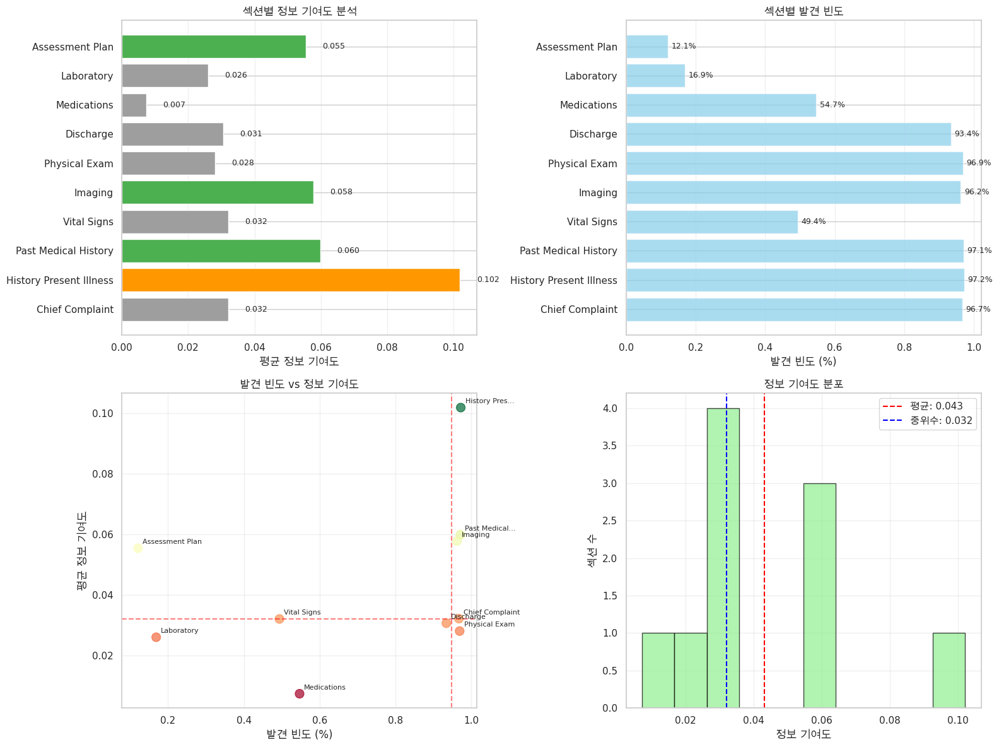


📋 상세 분석 테이블:
🎯 4사분면 분석 결과:
----------------------------------------------------------------------------------------------------
1. 🔴 고빈도 + 고기여도 (핵심 섹션들):
   • Chief Complaint: 기여도 0.032, 발견율 96.7%
   • History Present Illness: 기여도 0.102, 발견율 97.2%
   • Past Medical History: 기여도 0.060, 발견율 97.1%
   • Imaging: 기여도 0.058, 발견율 96.2%
   → 가장 중요한 섹션들. 반드시 정교하게 처리 필요

2. 🟡 저빈도 + 고기여도 (특별 관리 섹션들):
   • Assessment Plan: 기여도 0.055, 발견율 12.1%
   → 발견되면 매우 중요한 정보. 특별 관리 필요

3. 🟢 고빈도 + 저기여도 (보조 섹션들):
   • Physical Exam: 기여도 0.028, 발견율 96.9%
   → 자주 등장하지만 기여도 낮음. 표준화된 처리 적용

4. ⚪ 저빈도 + 저기여도 (선택적 섹션들):
   • Vital Signs: 기여도 0.032, 발견율 49.4%
   • Discharge: 기여도 0.031, 발견율 93.4%
   • Medications: 기여도 0.007, 발견율 54.7%
   • Laboratory: 기여도 0.026, 발견율 16.9%
   → 우선순위 낮음. 필요시에만 처리

🚀 실무 적용 가이드라인:
1. 정보 추출 우선순위:
   최우선 (1순위): History Present Illness
   최우선 (2순위): Past Medical History
   우선 (3순위): Imaging
   우선 (4순위): Assessment Plan
   우선 (5순위): Chief Complaint
   보통 (6순위): Vital Signs
   보통 (7순위): Dischar

In [49]:
# ============================================================================
# 정보 중요도 맵 시각화
# ============================================================================

print("📊 정보 중요도 맵 시각화 생성 중...")

import matplotlib.pyplot as plt
import seaborn as sns

# 시각화 설정
plt.rcParams['font.family'] = ['DejaVu Sans', 'Malgun Gothic', 'Arial Unicode MS']
plt.rcParams['axes.unicode_minus'] = False

# 1. 섹션별 정보 기여도 히트맵
if section_avg_importance:
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))
    
    # 1-1. 정보 기여도 막대 차트
    sections = [s.replace('_', ' ').title() for s in section_avg_importance.keys()]
    scores = [stats['avg_score'] for stats in section_avg_importance.values()]
    coverage_rates = [stats['coverage_rate'] for stats in section_avg_importance.values()]
    
    # 색상 매핑 (기여도 기준)
    colors = ['#d32f2f' if score > 0.15 else '#ff9800' if score > 0.10 else 
             '#4caf50' if score > 0.05 else '#9e9e9e' for score in scores]
    
    bars = ax1.barh(sections, scores, color=colors)
    ax1.set_xlabel('평균 정보 기여도')
    ax1.set_title('섹션별 정보 기여도 분석')
    ax1.grid(axis='x', alpha=0.3)
    
    # 값 표시
    for i, (bar, score) in enumerate(zip(bars, scores)):
        ax1.text(score + 0.005, bar.get_y() + bar.get_height()/2, 
                f'{score:.3f}', va='center', fontsize=9)
    
    # 1-2. 발견 빈도 차트
    bars2 = ax2.barh(sections, coverage_rates, color='skyblue', alpha=0.7)
    ax2.set_xlabel('발견 빈도 (%)')
    ax2.set_title('섹션별 발견 빈도')
    ax2.grid(axis='x', alpha=0.3)
    
    # 값 표시
    for i, (bar, rate) in enumerate(zip(bars2, coverage_rates)):
        ax2.text(rate + 0.01, bar.get_y() + bar.get_height()/2, 
                f'{rate:.1%}', va='center', fontsize=9)
    
    # 1-3. 기여도 vs 발견빈도 산점도
    ax3.scatter(coverage_rates, scores, s=100, alpha=0.7, c=scores, cmap='RdYlGn')
    
    # 각 점에 섹션명 표시
    for i, section in enumerate(sections):
        if len(section) > 15:  # 긴 이름은 줄여서 표시
            section_short = section[:12] + "..."
        else:
            section_short = section
        ax3.annotate(section_short, (coverage_rates[i], scores[i]), 
                    xytext=(5, 5), textcoords='offset points', fontsize=8)
    
    ax3.set_xlabel('발견 빈도 (%)')
    ax3.set_ylabel('평균 정보 기여도')
    ax3.set_title('발견 빈도 vs 정보 기여도')
    ax3.grid(alpha=0.3)
    
    # 4사분면 분석을 위한 기준선
    median_coverage = np.median(coverage_rates)
    median_score = np.median(scores)
    ax3.axhline(y=median_score, color='red', linestyle='--', alpha=0.5)
    ax3.axvline(x=median_coverage, color='red', linestyle='--', alpha=0.5)
    
    # 1-4. 정보 기여도 분포 히스토그램
    ax4.hist(scores, bins=10, alpha=0.7, color='lightgreen', edgecolor='black')
    ax4.axvline(x=np.mean(scores), color='red', linestyle='--', 
               label=f'평균: {np.mean(scores):.3f}')
    ax4.axvline(x=np.median(scores), color='blue', linestyle='--', 
               label=f'중위수: {np.median(scores):.3f}')
    ax4.set_xlabel('정보 기여도')
    ax4.set_ylabel('섹션 수')
    ax4.set_title('정보 기여도 분포')
    ax4.legend()
    ax4.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# 2. 상세 분석 테이블
print("\n📋 상세 분석 테이블:")
print("="*100)

# 4사분면 분석
if section_avg_importance:
    median_coverage = np.median(coverage_rates)
    median_score = np.median(scores)
    
    quadrants = {
        'high_freq_high_impact': [],  # 고빈도, 고기여도
        'low_freq_high_impact': [],   # 저빈도, 고기여도  
        'high_freq_low_impact': [],   # 고빈도, 저기여도
        'low_freq_low_impact': []     # 저빈도, 저기여도
    }
    
    for i, (section_name, stats) in enumerate(section_avg_importance.items()):
        coverage_rate = stats['coverage_rate']
        score = stats['avg_score']
        
        if coverage_rate >= median_coverage and score >= median_score:
            quadrants['high_freq_high_impact'].append((section_name, stats))
        elif coverage_rate < median_coverage and score >= median_score:
            quadrants['low_freq_high_impact'].append((section_name, stats))
        elif coverage_rate >= median_coverage and score < median_score:
            quadrants['high_freq_low_impact'].append((section_name, stats))
        else:
            quadrants['low_freq_low_impact'].append((section_name, stats))
    
    print("🎯 4사분면 분석 결과:")
    print("-" * 100)
    
    print("1. 🔴 고빈도 + 고기여도 (핵심 섹션들):")
    if quadrants['high_freq_high_impact']:
        for section_name, stats in quadrants['high_freq_high_impact']:
            print(f"   • {section_name.replace('_', ' ').title()}: "
                  f"기여도 {stats['avg_score']:.3f}, 발견율 {stats['coverage_rate']:.1%}")
        print("   → 가장 중요한 섹션들. 반드시 정교하게 처리 필요")
    else:
        print("   • 해당 없음")
    
    print("\n2. 🟡 저빈도 + 고기여도 (특별 관리 섹션들):")
    if quadrants['low_freq_high_impact']:
        for section_name, stats in quadrants['low_freq_high_impact']:
            print(f"   • {section_name.replace('_', ' ').title()}: "
                  f"기여도 {stats['avg_score']:.3f}, 발견율 {stats['coverage_rate']:.1%}")
        print("   → 발견되면 매우 중요한 정보. 특별 관리 필요")
    else:
        print("   • 해당 없음")
    
    print("\n3. 🟢 고빈도 + 저기여도 (보조 섹션들):")
    if quadrants['high_freq_low_impact']:
        for section_name, stats in quadrants['high_freq_low_impact']:
            print(f"   • {section_name.replace('_', ' ').title()}: "
                  f"기여도 {stats['avg_score']:.3f}, 발견율 {stats['coverage_rate']:.1%}")
        print("   → 자주 등장하지만 기여도 낮음. 표준화된 처리 적용")
    else:
        print("   • 해당 없음")
    
    print("\n4. ⚪ 저빈도 + 저기여도 (선택적 섹션들):")
    if quadrants['low_freq_low_impact']:
        for section_name, stats in quadrants['low_freq_low_impact']:
            print(f"   • {section_name.replace('_', ' ').title()}: "
                  f"기여도 {stats['avg_score']:.3f}, 발견율 {stats['coverage_rate']:.1%}")
        print("   → 우선순위 낮음. 필요시에만 처리")
    else:
        print("   • 해당 없음")

# 3. 실무 적용 가이드라인
print(f"\n🚀 실무 적용 가이드라인:")
print("="*100)

print("1. 정보 추출 우선순위:")
if sorted_sections:
    for i, (section_name, stats) in enumerate(sorted_sections, 1):
        priority = "최우선" if i <= 2 else "우선" if i <= 5 else "보통"
        print(f"   {priority} ({i}순위): {section_name.replace('_', ' ').title()}")

print("\n2. 섹션별 처리 전략:")
if sorted_sections:
    for section_name, stats in sorted_sections:
        if stats['avg_score'] > 0.15:
            strategy = "정밀 추출 + 상세 분석"
        elif stats['avg_score'] > 0.10:
            strategy = "핵심 내용 추출"
        elif stats['avg_score'] > 0.05:
            strategy = "요약 수준 추출"
        else:
            strategy = "선택적 추출"
        
        print(f"   • {section_name.replace('_', ' ').title()}: {strategy}")

print("\n3. 품질 보증 체크포인트:")
high_variance_sections = [s[0] for s in sorted_sections if s[1]['std_score'] > 0.1]
if high_variance_sections:
    print("   ⚠️  높은 변동성 섹션들 (일관성 검토 필요):")
    for section in high_variance_sections:
        std_score = section_avg_importance[section]['std_score']
        print(f"      - {section.replace('_', ' ').title()} (표준편차: {std_score:.3f})")

print(f"\n📊 정보 중요도 맵 시각화 완료!")
print("="*100)